Importing neccessary libraries

In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Subset
import torchvision.datasets as datasets   
import numpy as np
import matplotlib.pyplot as plt
import torchvision.utils as vutils
import matplotlib.animation as animation
import torchvision
from sklearn.metrics import f1_score
import copy
%matplotlib inline
seed = 42
torch.manual_seed(seed)
torch.cuda.manual_seed(seed)
from sklearn.metrics import precision_score, recall_score, f1_score, confusion_matrix, classification_report
import shutil
import time
import torchvision.models as models
from torch.optim import lr_scheduler
from sklearn.model_selection import train_test_split
from PIL import Image

# F-GAN Objective

Given a set of iid samples $\{x_1, x_2, ..., x_n\} \sim \mathbb{P}_{x}$, we want to sample from $\mathbb{P}_{x}$. To do this we assume a parametric functional form on $\mathbb{P}_{x}$, say $\mathbb{P}_{\theta}$, and aim to learn $\theta$ so as to minimize the f-divergence between $\mathbb{P}_{x}$ and $\mathbb{P}_{\theta}$. In essence, our objective is 

$$
\theta^* = \argmax_\theta D_f(\mathbb{P}_{x} || \mathbb{P}_{\theta})
$$

We use the variational lower bound on the f-divergence $D_f(\mathbb{P}_{x} || \mathbb{P}_{\theta})$ in order to estimate the generative model $\mathbb{P}_{\theta}$ given the true distribution $\mathbb{P}_{x}$. Then, the f-GAN objective can be defined as:

$$
\min_\theta \max_w \mathbb{E}_{x \sim \mathbb{P}_{x}} [g_f(V_w(x))] + \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\theta}} [-f^*(g_f(V_w(\hat{x})))]
$$

where $f^*$ is the fenchel conjugate for f, $V_w : \mathcal{X} \rightarrow \mathbb{R}$ without any range constraints on the output, and $g_f : \mathbb{R} \rightarrow dom_{f^*}$ is an output activation function specific to the f-divergence used. To approximate $\mathbb{E}_{x \sim \mathbb{P}_{x}} [.]$, we sample batch_size images without replacement from the training set. To approximate $\mathbb{E}_{\hat{x} \sim \mathbb{P}_{\theta}} [.]$, we sample batch_size from the current generative model $\mathbb{P}_{\theta}$.

By setting $f(u) = u\log u - (1+u)\log (1+u)$, $D_w(x) = 1/(1 + e^{-V_w(x)})$, and $g_f(v) = -\log (1 + e^{-v})$, we get the standard GAN objective:

$$
\min_\theta \max_w \mathbb{E}_{x \sim \mathbb{P}_{x}} [\log D_w(x)] + \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\theta}} [\log(1 - D_w(\hat{x}))]
$$

The Discriminator tries to distinguish between real and generated data, while the Generator attempts to fool the Discriminator, generating more realistic data. This adversarial process leads to the training of both models.


### Modified Loss Function

In many GAN papers, the standard loss function to optimize the Generator (G) is formulated as:

$$
\min_\theta \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\theta}} [\log(1 - D_w(\hat{x}))] 
$$

However, in practice, it is common to use the alternative formulation:

$$
\max_\theta \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\theta}} [\log(D_w(\hat{x}))]
$$

This modification is often used because the original formulation can lead to vanishing gradients, especially in the early stages of training, making it difficult for the generator to learn effectively. Goodfellow et al. (2014) proposed this adjustment to maintain more stable gradient flow during training.


In [2]:
data_dir = "Animals_data"  
ngpu = 1 
img_size = 128
batch_size = 128
z=100 
workers = 4 
gf = 64 
df = 64 
lr = 0.0002
beta1 = 0.5 
epochs = 5 

### Dataset and DataLoader Setup

In [ ]:
dataset  =  datasets.ImageFolder(root=data_dir, transform=transforms.Compose([
    transforms.Resize(img_size),
    transforms.CenterCrop(img_size),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
]))

dataloader = DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

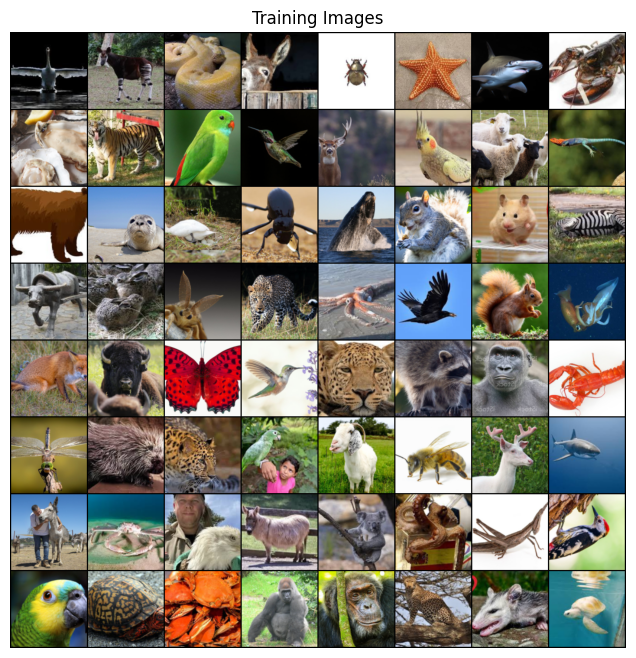

### Weights Initialization (According to DCGAN paper)

In [4]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

# Approach and Model Architecture


#### 1. Strided Convolutions

Deterministic pooling functions, like max pooling, were replaced with strided convolutions in the generator and discriminator, allowing the network to learn spatial downsampling and upsampling.

#### 2. Global Average Pooling

Fully connected layers were eliminated. Global average pooling improved model stability but reduced convergence speed. Instead, the highest convolutional features were directly linked to the generator's input and the discriminator's output.

#### 3. Batch Normalization

Batch Normalization (Ioffe & Szegedy, 2015) stabilized learning by normalizing inputs to each unit, promoting gradient flow. It was excluded from the generator's output layer and the discriminator's input layer to prevent instability.

#### 4. Activation Functions

ReLU activation was used in the generator, with Tanh for the output layer to improve learning. Leaky ReLU was employed in the discriminator for better performance in higher-resolution modeling.

#### Architecture Guidelines for Stable Deep Convolutional GANs

- **Replace pooling layers** with strided convolutions.
- **Use Batch Normalization** in both the generator and discriminator.
- **Remove fully connected layers** for deeper architectures.
- **Utilize ReLU activation** in the generator, except for the output layer (Tanh).


### Generator Architecture (Summary)

This PyTorch `Generator` model uses a series of transpose convolutional layers to upsample a latent vector (`z`) into an RGB image. Key components include:

- **ConvTranspose2d** layers: Upsample the input progressively.
- **BatchNorm2d**: Stabilizes training by normalizing outputs.
- **ReLU**: Non-linear activation after each layer.
- **Tanh**: Final activation function to scale the output between -1 and 1 (for image generation).

The generator transforms the low-dimensional latent space into a realistic image through multiple layers of upsampling and non-linearities.


In [ ]:
# Generator
class Generator(nn.Module):
    def __init__(self): 
        super(Generator, self).__init__()  
        self.gen = nn.Sequential(
            nn.ConvTranspose2d(in_channels=z, out_channels=gf*16, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(gf*16),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=gf*16, out_channels=gf*8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(gf*8),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=gf*8, out_channels=gf*4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(gf*4),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=gf*4, out_channels=gf*2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(gf*2),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=gf*2, out_channels=gf, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(gf),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=gf, out_channels=3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
            
        )
    def forward(self, input):
        return self.gen(input)

### Model Initialization and Setup

In [ ]:
Gen_model = Generator().to(device)    
Gen_model.apply(weights_init) 

## DiffAugment

In our dataset, we have only 60 images from each class, and this might not be enough to properly train a GAN. Hence, a simple strategy to improve model generalization is to use data augmentation. But applying data augmentation directly can raise several problems while training GANs:

1. If we apply augmentation T to the reals only, the loss function becomes:
$$
L_D = \mathbb{E}_{x \sim \mathbb{P}_{x}} [\log D_w(T(x))] + \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\theta}} [\log(1 - D_w(\hat{x}))]
$$

$$
L_G = \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\theta}} [\log(1 - D_w(\hat{x}))] 
$$

However, now the model is learning a different data distribution, T(x) instead of x, Now, the generator will learn to produce T(x) instead of x.

2. If we apply augmentation T to the discriminator only, the loss function becomes:
$$
L_D = \mathbb{E}_{x \sim \mathbb{P}_{x}} [\log D_w(T(x))] + \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\theta}} [\log(1 - D_w(T(\hat{x})))]
$$

$$
L_G = \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\theta}} [\log(1 - D_w(\hat{x}))] 
$$

However, now the discriminator learns to distinguish between T(x) and T(G(z)), but it fails to recognize G(z) as fakes. Since while training the generator, we are passing G(z) and not T(G(z)) to D, the generator is easily able to fool the discriminator. Hence the generator cannot learn anything from the discriminator.

3. Finally, we augment everywhere, and the loss function becomes:
$$
L_D = \mathbb{E}_{x \sim \mathbb{P}_{x}} [\log D_w(T(x))] + \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\theta}} [\log(1 - D_w(T(\hat{x})))]
$$

$$
L_G = \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\theta}} [\log(1 - D_w(T(\hat{x})))] 
$$

This is precisely the loss function introduced in DiffAugment. But this requires the augmentations to be differentiable in order to train the generator. Hence, in our implementation we use the Kornia library to perform augmentations which allows for the augmentations to be differentiable.

### Discriminator Architecture (with Augmentation)

This PyTorch `Discriminator` class builds a convolutional neural network for distinguishing real from fake images. Key components include:

- **Convolutional Layers**: Six `Conv2d` layers progressively downsample the input, increasing feature depth (`df`, `df*2`, etc.).
- **LeakyReLU Activation**: Introduces non-linearity after each convolution with a slope of 0.2.
- **BatchNorm2d**: Normalizes activations for stable training.
- **Sigmoid Output**: Outputs a probability indicating whether the image is real or fake.

If an `augment_module` from `kornia` is provided, it applies augmentations to the discriminator inputs; otherwise, it defaults to no augmentation (`nn.Identity`). Additionally, Gaussian noise is added to the input, controlled by `noise_variance`.

In [ ]:
import kornia.augmentation as K

class Discriminator(nn.Module):
    def __init__(self,augment_module='None'):
        super(Discriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=df, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df, out_channels=df*2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(df*2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df*2, out_channels=df*4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(df*4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df*4, out_channels=df*8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(df*8),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df*8, out_channels=df*16, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(df*16),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df*16, out_channels=1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
            
        )
        
        if augment_module is not None:
            self.augment_module = augment_module
            
        else:
            self.augment_module = nn.Identity()
            
            
    def forward(self, input, noise_variance):
        input = self.augment_module(input)
        input = input + noise_variance*torch.randn_like(input)
        return self.disc(input)

### Discriminator Setup with Data Augmentation

**Augmentation Module**:
- The `augment_module` is defined using Kornia's augmentation functions:
  - `K.RandomAffine`: Applies random affine transformations (translation up to 1/8 of the image size).
  - `K.RandomErasing`: Randomly erases parts of the image (up to 20% of the area) with a 90% probability.

Note that in addition to this, we also randomly flip input images horizontally while loading the data as suggested in the DiffAugment papaer.

In [ ]:
mosaic_kwargs = {"nrow": 10, "normalize": True}
n_mosaic_cells = 10 * 10
 
augment_module = torch.nn.Sequential(
    K.RandomAffine(degrees=0, translate=(1 / 8, 1 / 8), p=0.9),
    K.RandomErasing((0.0, 0.2), p=0.9),
)
Disc_model = Discriminator(augment_module=augment_module).to(device)
    
Disc_model.apply(weights_init)


### Loss Function and Optimizer Setup

In [9]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(64, z, 1, 1, device=device)

real_label = 1
fake_label = 0

disc_lr = 0.0002
gen_lr = 0.0002

optimizerD = optim.Adam(Disc_model.parameters(), lr=disc_lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(Gen_model.parameters(), lr=gen_lr, betas=(beta1, 0.999))


## Training

### Hyperparameters for DC-GAN Model

| Hyperparameter  | Value        | Description                                    |
|-----------------|--------------|------------------------------------------------|
| `img_size`      | 128          | Size to resize images (128x128 pixels)         |
| `batch_size`    | 128          | Number of images per batch                     |
| `z`             | 100          | Dimensionality of the latent vector (input to the generator) |
| `gf`            | 64           | Size of feature maps in the generator          |
| `df`            | 64           | Size of feature maps in the discriminator      |
| `lr`            | 0.0002       | Learning rate for the optimizer                |
| `beta1`         | 0.5          | Beta1 hyperparameter for Adam optimizer        |
| `epochs`        | 400          | Number of training epochs                      |
| `disc_lr`       | 0.0002       | Learning rate for the discriminator            |
| `gen_lr`        | 0.0002       | Learning rate for the generator                |


In this experiment, we sampled the random input vector `z` from a Gaussian distribution instead of a uniform distribution. Specifically, ` noise = torch.randn(b_size, z, 1, 1, device=device)` generates random noise from a standard normal distribution (mean 0, variance 1), which is used as the input to the generator.

Sampling `z` from a Gaussian distribution aids in parameter regularization by ensuring that the noise input is well-distributed around the mean.

In [10]:
img_list = []
gen_losses = [] 
disc_losses = []
label_smoothing = False
noise_variance = 0
gen_updates = 1
disc_updates = 1

### GAN Training Loop
This training loop is adapted from the DCGAN PyTorch tutorial.
1. **Discriminator Update**:
   - For each batch, real images are passed through the **Discriminator**, and the loss for real (`errD_real`) and fake images (`errD_fake`) is computed. The total discriminator loss (`errD`) is backpropagated, and the **Discriminator** is updated.

2. **Generator Update**:
   - The **Generator** is updated by maximizing the **Discriminator**'s output on fake images. The loss (`errG`) is backpropagated, and the **Generator** is updated.




In [ ]:
if not os.path.exists("./dcgan"):
    os.makedirs("./dcgan")
iters = 0
num_epochs = 400
print("Starting Training Loop...")

for epoch in range(1, num_epochs+1):
    
    for i,data in enumerate(dataloader, 0):
    
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        
        # update Disc model : maximize log(D(x)) + log(1 - D(G(z)))
        Disc_model.zero_grad()
        label = torch.full((b_size,), real_label, device=device, dtype=torch.float)
        output = Disc_model(real_cpu, noise_variance).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()
        
        noise = torch.randn(b_size, z, 1, 1, device=device)
        fake = Gen_model(noise)
        label.fill_(fake_label)
        output = Disc_model(fake.detach(), noise_variance).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()
        
        disc_losses.append(errD.item())
            
        # update Gen model : maximize log(D(G(z)))
        Gen_model.zero_grad()
        label.fill_(real_label)
        output = Disc_model(fake, noise_variance).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        gen_losses.append(errG.item())
    
        if i % 10 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                    % (epoch, num_epochs, i, len(dataloader),
                        errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
        if (iters)%500 == 0 or (i == len(dataloader)-1) or (epoch == num_epochs):
            with torch.no_grad():
                fake = Gen_model(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
            if not os.path.exists("./dcgan/generated_animals"):
                os.makedirs("./dcgan/generated_animals")
            
            plt.imsave(f"./dcgan/generated_animals/{epoch}_{iters}.png",img_list[-1].numpy().transpose(1,2,0))
            
        iters += 1
        
    if epoch%25 == 0:
        if not os.path.exists("./dcgan/models"):
            os.makedirs("./dcgan/models")
            
        torch.save(Gen_model.state_dict(), f"./dcgan/models/gen_{epoch}.pth")
        torch.save(Disc_model.state_dict(), f"./dcgan/models/disc_{epoch}.pth")

### Loss Visualization

The following plot illustrates the loss curves for both the **Generator** (G) and **Discriminator** (D) during training. 

- **X-axis**: Iterations
- **Y-axis**: Loss values

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(gen_losses,label="G")
plt.plot(disc_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

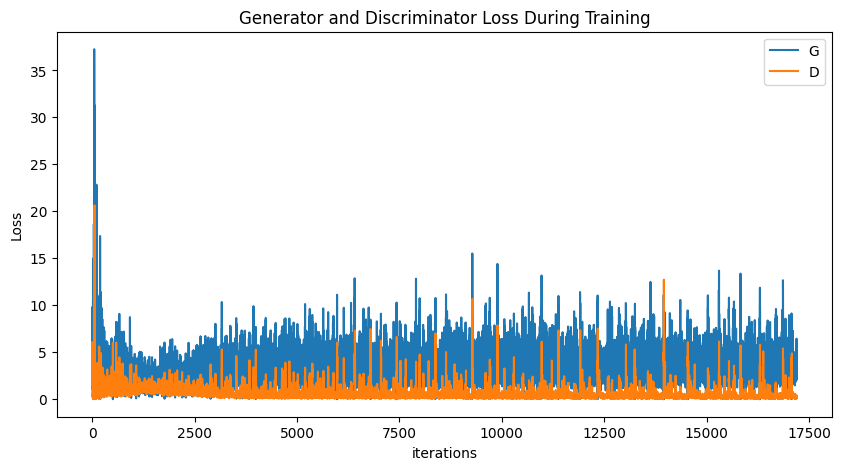

### Real vs. Fake Images

The following visualization compares real images from the training dataset with fake images generated by the **Generator**:

1. **Left Panel**: Displays a grid of real images sampled from the training dataset.
2. **Right Panel**: Shows the most recent batch of fake images produced by the **Generator**.


In [ ]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

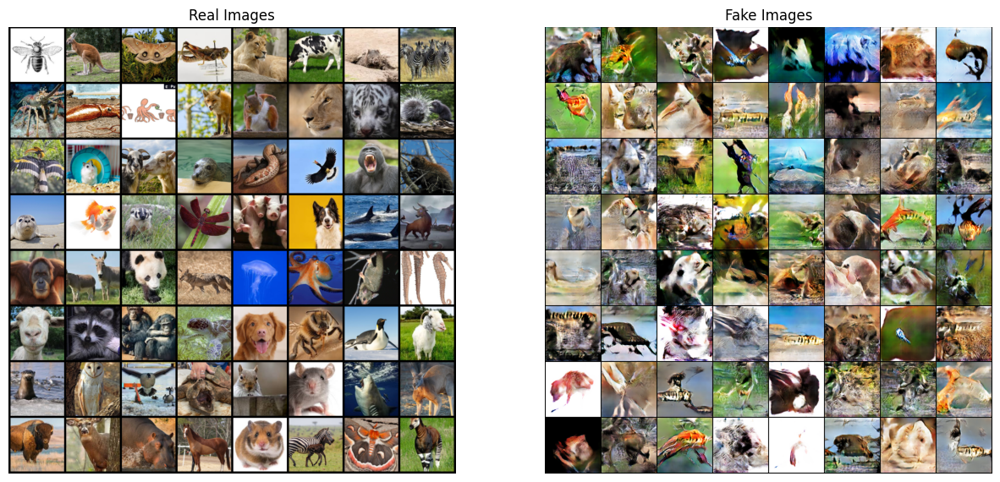

In [ ]:
netG = Generator().to(device)
netG.load_state_dict(torch.load(f"./dcgan/models/gen_400.pth"))
netG.eval()

fixed_noise = torch.randn(100, z, 1, 1, device=device)
images = netG(fixed_noise)

plt.figure(figsize=(10,10))
plt.axis("off")
plt.title("Generated Images")
plt.imshow(np.transpose(vutils.make_grid(images, nrow=10, padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

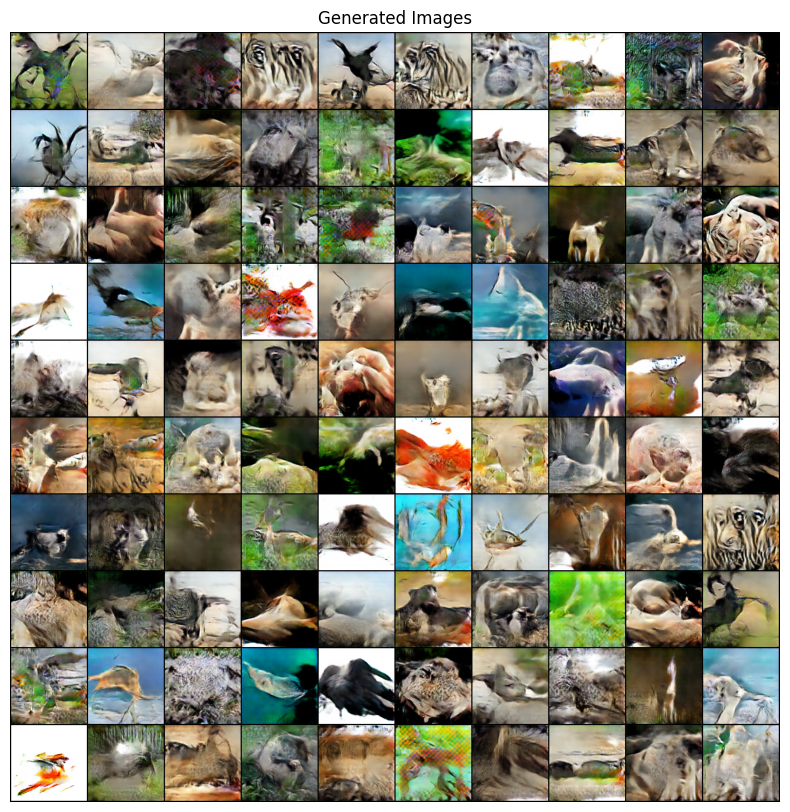

### **Analysis of Images**

From the generated images, backgrounds of blue indicating attempts to generate aquatic life are quite frequent. We are also able to see patterns distinct to certain animals such as the stripes of a Zebra (1st row 4th column, 7th row 10th column), and brief outlines of Sparrows (4th row 1st column, and 10th row 1st column). However, these can also be treated as examples of **mode collapse** since both images within each animal class follow a very similar pattern. Backgrounds of green are also present showing that the model associates greenery with wildlife. 


We varied the number of training steps for the generator and discriminator in each iteration and documented the outcomes.

- **Discriminator steps = 3, Generator step = 1**:  
  In this case, the discriminator quickly became too strong, and its loss dropped to 0 early, making it difficult for the generator to improve.
  
- **Generator steps = 3, Discriminator step = 1**:  
  When the generator was trained more frequently, its loss steadily decreased. However, this led to the generator producing garbage images that were able to fool the discriminator, despite the images not appearing real. This indicated that the discriminator was too weak to provide meaningful feedback.

To balance the training, using equal update steps for both the generator and discriminator (**gen_update = 1**, **disc_update = 1**) helped maintain a healthier competition between the two.


We experimented with dynamically adjusting the training schedule for the generator and discriminator based on their respective losses. Specifically, we used a heuristic approach where we trained D while `lossD > A` and G while `lossG > B`. However, this method did not yield any improvements and led to unstable training.


It was also observed adding noise to the discriminator resulted in stable training and better generation. Hence, we added noise with normal distribution 0 mean and 0.2 variance.

#### Frechet Inception Distance (FID) Calculation

The Fréchet Inception Distance (FID) is a metric used to evaluate the quality of images generated by GANs. It compares the distribution of real-world images with that of synthetic images generated by the model. FID is based on the Fréchet distance (or Wasserstein-2 distance) between two multivariate Gaussians: one from the real images and one from the generated images.

Let $ m, C $ represent the mean and covariance matrix of the real-world image distribution $ p(.)$, and $ m_w, C_w $ represent the mean and covariance matrix of the generated image distribution $p_w(.) $. The FID is calculated as:

$$
d^2((m, C), (m_w, C_w)) = || m - m_w ||^2_2 + \text{Tr}(C + C_w - 2(C C_w)^{1/2})
$$

This formula combines the difference in means and the trace of the covariance matrices, providing a measure of how close the two distributions are. Lower FID scores indicate that the generated images are closer to the real images in terms of visual quality.


This code snippet generates fake images using the **Generator** at different epochs and computes the **Frechet Inception Distance (FID)** to evaluate the quality of the generated images.

In this experiment, the **torch_fidelity** library was utilized for calculating the FID, as it is allowed to be used and it provides an efficient implementation for this metric.

In [ ]:
from torchvision.utils import make_grid, save_image
import torch_fidelity
torch_fidelity.defaults.DEFAULTS['samples_find_deep'] = True
device = 'cuda'
netG = Generator().to(device)

num_images = 1000
batch_size = 100
num_batches = num_images//batch_size
fids = {}

for epoch in range(25,num_epochs+1,25):
    netG.load_state_dict(torch.load(f'./dcgan/models/gen_{epoch}.pth'))
    netG.eval()
    for i in range(num_batches):
        noise = torch.randn(batch_size, z, 1, 1, device=device)
        gen_samples = netG(noise).detach().cpu()
        for id, sample in enumerate(gen_samples):
            sample = sample.view(3,
                                128,
                                128)
            sample = (sample/2.0 + 0.5).clip(0,1)
            if not os.path.exists('./dcgan/fid'):
                os.makedirs('./dcgan/fid')
                
            save_image(sample, os.path.join('./dcgan/fid', 'sample_{}.jpg'.format(i*batch_size + id)))

    metrics_dict = torch_fidelity.calculate_metrics(
    input1='./dcgan/fid', 
    input2='compare_animals', 
    cuda=True, 
    isc=True, 
    fid=True, 
    kid=True, 
    prc=True, 
    verbose=False,
    )
    fids[epoch] = metrics_dict['frechet_inception_distance']

### FID vs. Epoch Plot

This code snippet visualizes the relationship between the **epoch** number and the **Frechet Inception Distance (FID)** values. 

- **Plot Details**: 
  - The x-axis represents the epochs at which the FID was calculated.
  - The y-axis indicates the corresponding FID values, with lower values suggesting higher quality and diversity in generated images.
  - Each point on the line is marked with a circle (`-o`) to highlight the FID value for each epoch.



In [ ]:
plt.plot(list(fids.keys()),list(fids.values()),'-o')
plt.xlabel('Epoch')
plt.ylabel('FID')
plt.title('Epoch vs FID')
plt.show()

print("FID: ", metrics_dict['frechet_inception_distance'])

FID:  131.87570297962043

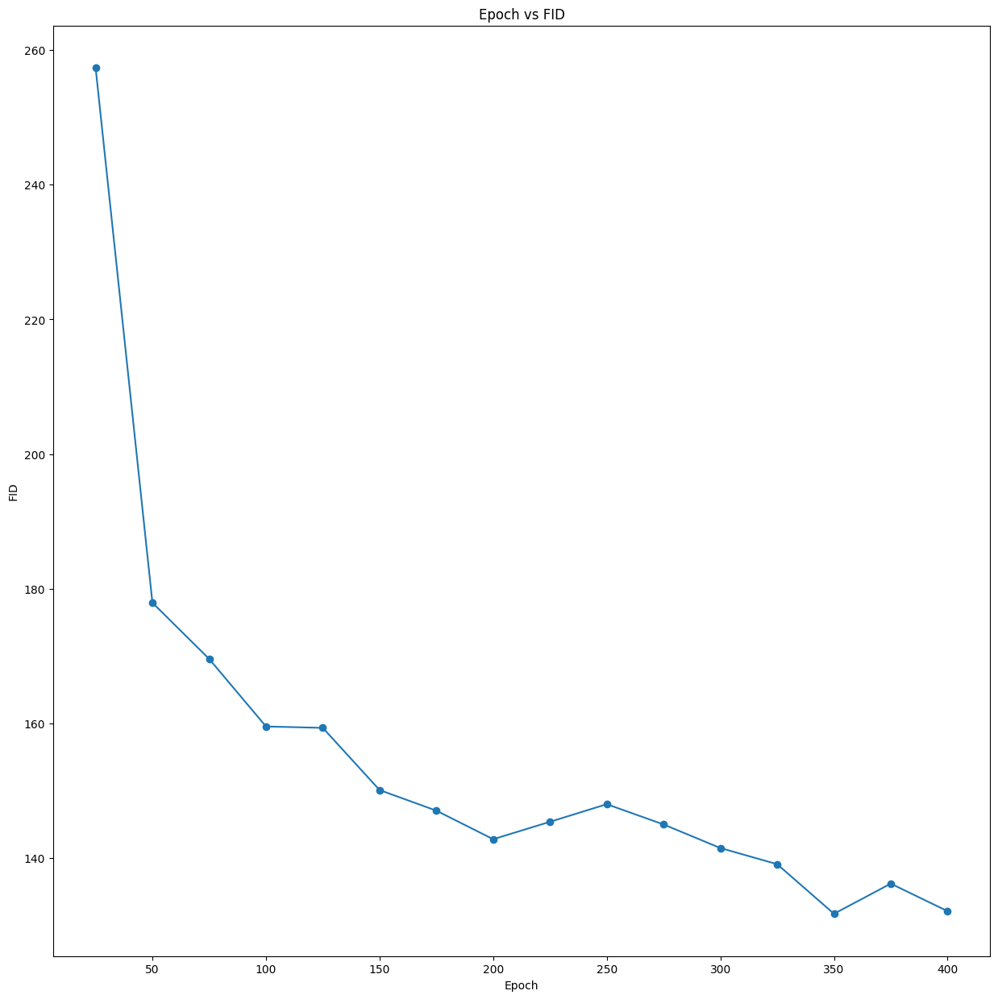

Image Generation via Latent Vector Interpolation

This code generates images by interpolating between two randomly sampled latent vectors using both **linear** and **spherical interpolation** methods.


### Linear Interpolation

**Linear interpolation** is a method of estimating unknown values that fall between known values by constructing a straight line between two points. For two vectors, say $v_1$ and $v_2$, the linear interpolation at a parameter $\alpha$ (where $0 \leq \alpha \leq 1$) is given by the formula:

$$
v_{\text{interp}} = (1 - \alpha) v_1 + \alpha v_2
$$

Where:

- When $\alpha = 0$, $v_{\text{interp}} = v_1$ (returns the first vector).
- When $\alpha = 1$, $v_{\text{interp}} = v_2$ (returns the second vector).
- For $0 < \alpha < 1$, the interpolated vector lies somewhere between $v_1$ and $v_2$.

In the context of **GANs** (Generative Adversarial Networks), linear interpolation is used to generate images that smoothly transition between two generated images by interpolating between their latent vectors. This is helpful in exploring the latent space and understanding how the generator evolves the data distribution.

### Spherical Interpolation (Slerp)

**Spherical Interpolation**, commonly known as **slerp**, is a technique used to interpolate between two points on a sphere, providing a smooth transition between orientations in three-dimensional space. 

The spherical interpolation between two vectors $ v_1 $ and $ v_2 $ can be expressed as:

$$
\text{slerp}(v_1, v_2, t) = \frac{\sin((1-t) \theta)}{\sin(\theta)} v_1 + \frac{\sin(t \theta)}{\sin(\theta)} v_2
$$

Where:
- $ \theta $ is the angle between the two vectors, calculated using the dot product.
- $ t $ is the interpolation parameter that ranges from 0 to 1.

/tmp/ipykernel_3534383/2308427908.py:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  netG.load_state_dict(torch.load(f'models_experiment2/gen_275.pth'))


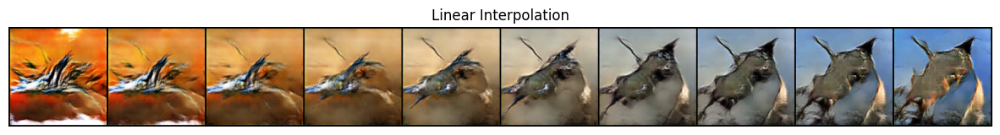

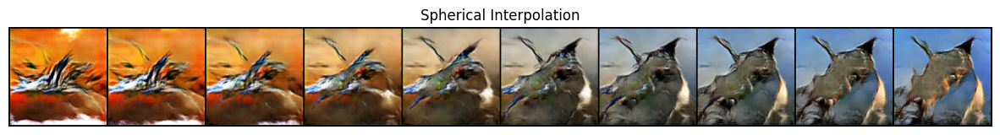

In [22]:
device = 'cuda'
netG = Generator().to(device)
netG.load_state_dict(torch.load(f'./dcgan/models/gen_300.pth'))
netG.eval()
z_dim = 100

def generate_images(latent_vectors):
    with torch.no_grad():
        images = netG(latent_vectors).cpu()
    return images

def linear_interpolation(z1, z2, steps=10):
    return [(1 - alpha) * z1 + alpha * z2 for alpha in np.linspace(0, 1, steps)]


def spherical_interpolation(z1, z2, steps=10):
    omega = np.arccos(np.dot(z1 / np.linalg.norm(z1), z2 / np.linalg.norm(z2)))
    return [torch.tensor(np.sin((1 - alpha) * omega) / np.sin(omega) * z1 + np.sin(alpha * omega) / np.sin(omega) * z2) for alpha in np.linspace(0, 1, steps)]


z1 = torch.randn(1, z_dim, 1, 1, device=device)
z2 = torch.randn(1, z_dim, 1, 1, device=device)


linear_latents = torch.stack(linear_interpolation(z1, z2)).view(-1, z_dim, 1, 1)


spherical_latents = torch.stack(spherical_interpolation(z1.squeeze().cpu().numpy(), z2.squeeze().cpu().numpy())).view(-1, z_dim, 1, 1).to(device)


linear_images = generate_images(linear_latents)
spherical_images = generate_images(spherical_latents)


def plot_images(images, title):
    grid = make_grid(images, nrow=10, normalize=True, scale_each=True)
    plt.figure(figsize=(15, 15))
    plt.imshow(grid.permute(1, 2, 0).numpy())
    plt.title(title)
    plt.axis('off')
    plt.show()

plot_images(linear_images, 'Linear Interpolation')
plot_images(spherical_images, 'Spherical Interpolation')


### Change of GAN Architecture from DC-GAN to StyleGAN

We also experimented with using StyleGAN over DC-GAN, but found that the result were not upto mark. In particular after 400 epochs of training, which took over 10 hrs, we were able to achieve an FID of only 168. Contrasting to this, training DC-GAN for 400 epochs took only 3.5 hrs, we were able to achieve an FID of 131. Note that both training schemes used DiffAugment.

This means that StyleGAN requires a longer time to converge as compared to DC-GAN. Hence, we used DC-GAN in the remainder of our experiments.

### Images produced by SyleGAN

Also note the quality of images produced by StyleGAN is much poorer than those produced by DC-GAN as evident below.

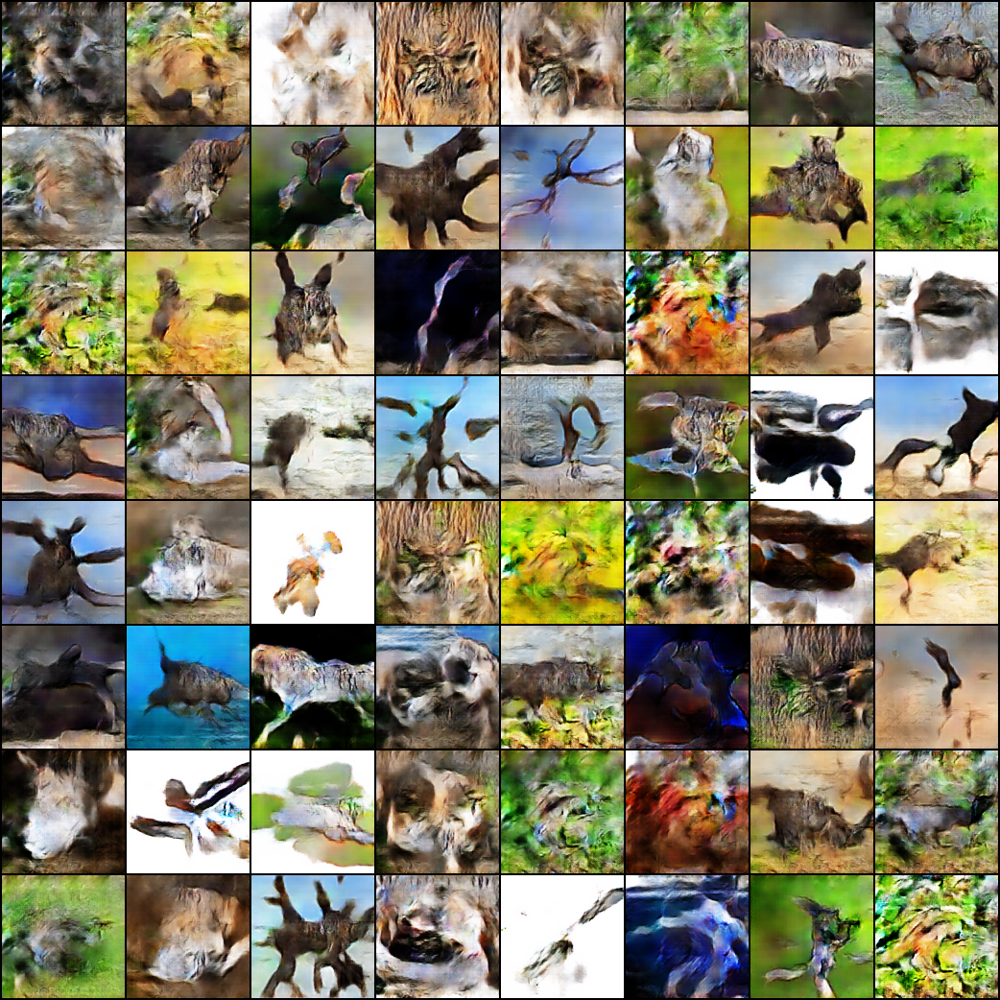

### Analysis of Images produced by StyleGAN

Note that in almost every image generated by StyleGAN there exists a distinct patch of color that take up a big chunk of the image (usually brown or black patches against a light background, and white patches against a dark background) in the position where an animal should exist. But StyleGAN has not learnt the features corresponding to any animal, and has been unable to fill in this patch. There is one particular image of note (3rd row 6th column) which is just a hodgepodge of red, blue, and green - indicating a total confusion of what to generate.

## DC-GAN Analysis
 
### 1. Experimentation
 
We have conducted the following experiments:
 
#### 1.1 One-sided Label Smoothing
 
- Instead of providing binary labels (1 and 0) to the discriminator, we used softened values such as 0.9 and 0.1.
- This approach has been shown to reduce the networks’ vulnerability to overfitting and improve generalization.
 
#### 1.2 Adding Noise to Inputs
 
- We observed that the true data distribution \( p_r \) and the generated data distribution \( p_g \) are disjoint in a high-dimensional space, which can lead to the vanishing gradient problem.
- To address this, we added continuous noise to the inputs of the discriminator to artificially "spread out" the distributions and increase the likelihood of overlap between the two probability distributions.
 
#### 1.3 Differential Augmentation Approach
 
- We implemented a differential augmentation approach, which helped improve the Fréchet Inception Distance (FID) score by 20 points, indicating enhanced image quality.
 
#### 1.4 Incorporating Gaussian Noise Instead of Uniform Sampling for Input
 
- In our experimentation, we opted to use Gaussian noise as input for the generator instead of uniform sampling for $ z$.
- Using Gaussian noise can provide smoother gradients during backpropagation, which may improve training stability.
 
#### 1.5 Training the Discriminator with Different Optimizers
 
- We trained the discriminator using Stochastic Gradient Descent (SGD) but found that the Adam optimizer yielded better results for our model.
 
#### 1.6 Updating Generator and Discriminator
 
- We experimented with training the generator a different number of times than the discriminator.
- However, our findings indicated that updating both the generator and discriminator the same number of times resulted in the best performance.
 
#### 1.7 Virtual Batch Normalization (VBN)
 
- We implemented Virtual Batch Normalization in our model; however, we did not achieve satisfactory results. One potential reason for this could be the limited size of the training dataset, which may have hindered the model's ability to generalize effectively when relying on a fixed reference batch.
- The lack of diversity in the reference batch could have resulted in suboptimal normalization, adversely affecting model performance.
 
**Virtual Batch Normalization (VBN)** is a technique where each data sample is normalized based on a fixed batch of data, known as the "reference batch," instead of being normalized within its minibatch. The reference batch is chosen once at the beginning of training and remains constant throughout the training process.

 
### 2. Quality of Generated Images
 
- The quality of the generated images is notably low due to the limited size of the training dataset(our assumption).
 
- For each class, there are only 60 images across 90 classes of animals. This scarcity of data poses significant challenges for the model, as animals exhibit a wide variety of features, poses, and visual characteristics. Learning these intricate details becomes difficult when the dataset lacks sufficient examples.
 
- Consequently, the generator struggles to capture the diverse representations of each animal, resulting in subpar image quality.
 
### 3. Mode Collapse
 
- During training, the generator may collapse to a setting where it always produces the same outputs.
 
- This is a common failure case for GANs, known as **Mode Collapse**.
 
- Although the generator might succeed in fooling the discriminator, it fails to learn the complex real-world data distribution and becomes stuck in a small subspace with very low variety. As a result, the generator outputs lack diversity and do not capture the richness of the real data.

- We have observed mode collapse for Zebra and Sparrow classes above.
 
### 4. DiffAugment using Kornia
- We integrated an augmentation module in the discriminator to improve model robustness and reduce overfitting.
 
- This module applies random affine transformations and random erasing to input images, allowing the discriminator to process more varied data.
 
- These augmentations help mitigate mode collapse and make the model less sensitive to minor variations in the training data.
 
- Additionally, random noise is added to the input for regularization, which can further improve training stability and generalization.
 
### 5. FID Scores
 
- Relatively high scores indicate room for improvement in image quality.
 
- On training for longer epochs ,we can expect further decrease in `FID` scores.
 
- We tried using `StyleGAN`, but its FID score is not better than that of `DC-GAN`. Additionally, the computation required for `StyleGAN` is expensive compared to `DC-GAN`.
 
 
### 6. Consistency and Potential for Further Training
 
- Continuing to train the DC-GAN for additional epochs has shown the potential to improve the Fréchet Inception Distance (FID) score.
 
- This is evident from the analysis of the epochs versus FID graph, which illustrates a trend of decreasing FID scores with extended training.



Instead of minimzing the f-divergence between $\mathbb{P}_{x}$ and $\mathbb{P}_{\theta}$, this work aims to minimize the $\textit{Wasserstein}$ distance between the two distributions. The objective function now becomes:

$$
\theta^* = \argmin_\theta W(\mathbb{P}_{x} || \mathbb{P}_{\theta}) = \argmin_\theta \inf_{\gamma \in \mathcal{T}} \mathbb{E}_{(x, y) \sim \gamma} ||x - y||
$$

where $\mathcal{T}$ is a set of joint distributions such that $\int_\mathcal{T} t \,dy = \mathbb{P}_x$ and $\int_\mathcal{T} t \,dx = \mathbb{P}_\theta$. Intuitively, this metric measures the last amount of "work done" to transform $\mathbb{P}_{x}$ into $\mathbb{P}_{\theta}$.

If we consider a parameterized family of functions, $f_w$ that are K-Lipschitz, taking the dual of the above objective gives us the W-GAN objective: 

$$
\min_\theta \max_w \mathbb{E}_{x \sim \mathbb{P}_{x}} [f_w(x)] - \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\theta}} [f_w(\hat{x})]
$$

We can represent $f_w$ using a neural network, but we must ensure that it is K-Lipschitz. To do this, there are two methods: (1) Weight clipping, and (2) Gradient Clipping. In our work, we consider Gradient Clipping.

In [ ]:
# Make no change to the generator
Gen_model = Generator().to(device)

if (device.type == 'cuda') and (ngpu > 1):
    Gen_model = nn.DataParallel(Gen_model, device_ids=[0, 1])
    
Gen_model.apply(weights_init)

### Changes to the Discriminator

1. In the discriminator, we remove the last sigmoid layer as we no require the discriminator's outputs to lie between 0 and 1.
2. We must avoid DiffAugment during computation of gradient penalty.

In [ ]:
class Discriminator_WGAN(nn.Module):
    def __init__(self, augment_module=None):
        super(Discriminator_WGAN, self).__init__()
        self.disc = nn.Sequential(
            nn.Conv2d(in_channels=3, out_channels=df, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df, out_channels=df*2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(df*2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df*2, out_channels=df*4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(df*4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df*4, out_channels=df*8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(df*8),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df*8, out_channels=df*16, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(df*16),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df*16, out_channels=1, kernel_size=4, stride=1, padding=0, bias=False),            
        )
        if augment_module is not None:
            self.augment_module = augment_module
        else:
            self.augment_module = nn.Identity()
            
    def forward(self, x, flag=True):
        if self.training and flag:
            x = self.augment_module(x)
        return self.disc(x)

In [ ]:
Disc_model = Discriminator_WGAN(augment_module=augment_module).to(device)

if (device.type == 'cuda') and (ngpu > 1):
    Disc_model = nn.DataParallel(Disc_model, device_ids=[0, 1])
    
Disc_model.apply(weights_init)

In [ ]:
def gradient_penalty(Disc_model, real, fake):    
    alpha = torch.rand((real.shape[0], 1, 1, 1)).to(device)
    interpolation = real * alpha + fake * (1 - alpha)
    interpolation.requires_grad_(True)

    # Very important that we don't do DiffAugment during computation of gradient penalty
    scores = Disc_model(interpolation, False)
    
    gradient_vals = torch.autograd.grad(inputs = interpolation, outputs = scores, grad_outputs = torch.ones_like(scores), create_graph = True, retain_graph = True)[0]
    gradient_vals = gradient_vals.view(gradient_vals.shape[0], -1)
    norm = gradient_vals.norm(2, dim = 1)
    penalty = torch.mean((norm - 1) ** 2)
    return penalty

### Hyperparameters for WGAN Model

| Hyperparameter  | Value        | Description                                    |
|-----------------|--------------|------------------------------------------------|
| `img_size`      | 128          | Size to resize images (128x128 pixels)         |
| `batch_size`    | 128          | Number of images per batch                     |
| `z`             | 100          | Dimensionality of the latent vector (input to the generator) |
| `gf`            | 64           | Size of feature maps in the generator          |
| `df`            | 64           | Size of feature maps in the discriminator      |
| `beta1`         | 0            | Beta1 hyperparameter for Adam optimizer        |
| `beta2`         | 0.9          | Beta2 hyperparameter for Adam optimizer        |
| `epochs`        | 400          | Number of training epochs                      |
| `disc_lr`       | 0.0001       | Learning rate for the discriminator            |
| `gen_lr`        | 0.0001       | Learning rate for the generator                |
| `lambda_gp`     | 10           | Lambda for gradient penalty                    |
| `n_critic`      | 5            | Number of discriminator updates per epoch      |

In [ ]:
fixed_noise = torch.randn(64, z, 1, 1, device=device)

# Use the learning rate of 1e-4, Adam optimizer, and betas = (0., 0.9) as suggested in the original W-GAN paper.
disc_lr = 0.0001
gen_lr = 0.0001

optimizerD = optim.Adam(Disc_model.parameters(), lr=disc_lr, betas=(0, 0.9))
optimizerG = optim.Adam(Gen_model.parameters(), lr=gen_lr, betas=(0, 0.9))

img_list = []
gen_losses = [] 
disc_losses = []
gen_updates = 1
disc_updates = 5 # Set discriminator updates to 5 per epoch as suggested in original W-GAN paper
lambda_gp = 10 # Set the lambda for gradient penalty to 10 as suggested in original W-GAN paper
num_epochs = 400

### WGAN Training

There's no longer any need of the CrossEntropyLoss. The discriminator objective simply minimizes the difference between the expected values of decoder outputs between fake and real images. A gradient penalty is also added to the discriminator's objective, to try to ensure that the discriminator is 1-Lipschitz.

The generator objective simply maximizes the expected vaule of decoder ouputs for fake images. Note that since the discriminator models $f_w$, we only need to ensure that the discriminator is 1-Lipschitz, and this constraint is not required for the generator.

In [ ]:
if not os.path.exists("./wgan"):
    os.makedirs("./wgan")

for epoch in range(1, num_epochs+1):
    
    for i,data in enumerate(dataloader, 0):
    
        real = data[0].to(device)
        b_size = real.size(0)
        
        for _ in range(disc_updates):
            Disc_model.zero_grad()
            output_real = Disc_model(real).view(-1)

            noise = torch.randn(b_size, z, 1, 1, device=device)
            fake = Gen_model(noise)
            output_fake = Disc_model(fake.detach()).view(-1)
            
            gp = gradient_penalty(Disc_model, real, fake, device = device)
            loss_disc = (torch.mean(output_fake) - torch.mean(output_real) + lambda_gp * gp )
            loss_disc.backward()
            optimizerD.step()

            disc_losses.append(loss_disc.item())
        
    
        for _ in range(gen_updates):
            # update Gen model : maximize log(D(G(z)))
            Gen_model.zero_grad()
            noise = torch.randn(b_size, z, 1, 1, device=device)
            fake = Gen_model(noise)
            output = Disc_model(fake).view(-1)
            loss_gen = - torch.mean(output)
            loss_gen.backward()
            optimizerG.step()

            gen_losses.append(loss_gen.item())
            
    
        if i % 10 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f'
                    % (epoch, num_epochs, i, len(dataloader),
                        loss_disc.item(), loss_gen.item()))
            
        if (iters)%500 == 0 or (i == len(dataloader)-1) or (epoch == num_epochs):
                with torch.no_grad():
                    fake = Gen_model(fixed_noise).detach().cpu()
                img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
                
                if not os.path.exists("./wgan/generated_animals"):
                    os.makedirs("./wgan/generated_animals")
                
                plt.imsave(f"./wgan/generated_animals/{epoch}_{iters}.png",img_list[-1].numpy().transpose(1,2,0))
                
        iters += 1
            
        if epoch%25 == 0:
            if not os.path.exists("./wgan/models"):
                os.makedirs("./wgan/models")
                
            torch.save(Gen_model.state_dict(), f"./wgan/models/gen_{epoch}.pth")
            torch.save(Disc_model.state_dict(), f"./wgan/models/disc_{epoch}.pth")
            

### Loss Visualization

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(gen_losses,label="G")
plt.plot(disc_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

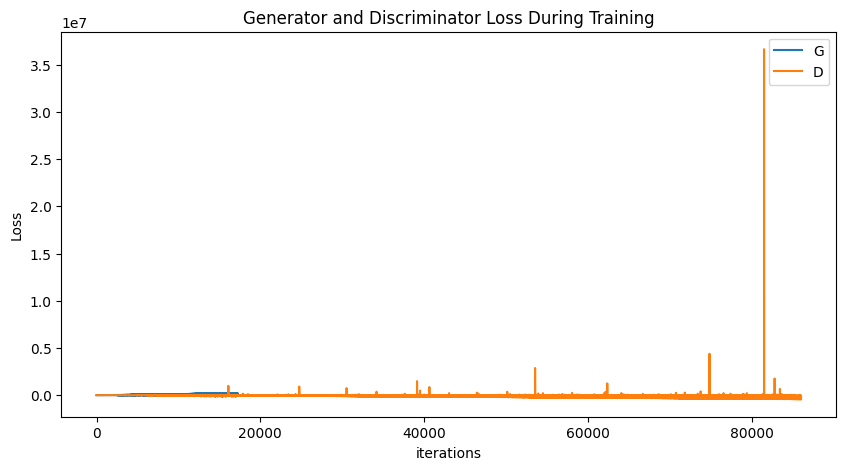

### Real images vs Fake images

In [ ]:
real_batch = next(iter(dataloader))
plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(img_list[-1],(1,2,0)))
plt.show()

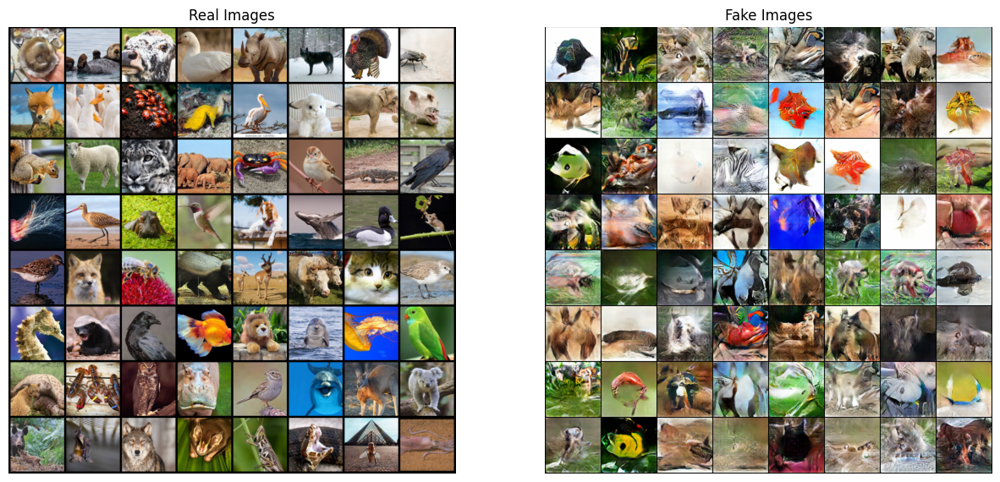

### FID vs Epochs

In [ ]:
from torchvision.utils import make_grid, save_image
import torch_fidelity
torch_fidelity.defaults.DEFAULTS['samples_find_deep'] = True
device = 'cuda'
netG = Generator().to(device)

num_images = 1000
batch_size = 100
num_batches = num_images//batch_size
fids = {}

for epoch in range(25,num_epochs+1,25):
    print(epoch)
    netG.load_state_dict(torch.load(f'./wgan/models/gen_{epoch}.pth'))
    netG.eval()
    for i in range(num_batches):
        noise = torch.randn(batch_size, z, 1, 1, device=device)
        gen_samples = netG(noise).detach().cpu()
        for id, sample in enumerate(gen_samples):
            sample = sample.view(3,
                                128,
                                128)
            sample = (sample/2.0 + 0.5).clip(0,1)
            if not os.path.exists('./dcgan/fid'):
                os.makedirs('./dcgan/fid')
                
            save_image(sample, os.path.join('./wgan/fid', 'sample_{}.jpg'.format(i*batch_size + id)))

    metrics_dict = torch_fidelity.calculate_metrics(
    input1='./wgan/fid', 
    input2='compare_animals', 
    cuda=True, 
    isc=True, 
    fid=True, 
    kid=True, 
    prc=True, 
    verbose=False,
    )
    fids[epoch] = metrics_dict['frechet_inception_distance']


In [ ]:
plt.plot(list(fids.keys()),list(fids.values()),'-o')
plt.xlabel('Epoch')
plt.ylabel('FID')
plt.title('Epoch vs FID')
plt.show()
print("FID: ", metrics_dict['frechet_inception_distance'])

FID: 129.84761324666988
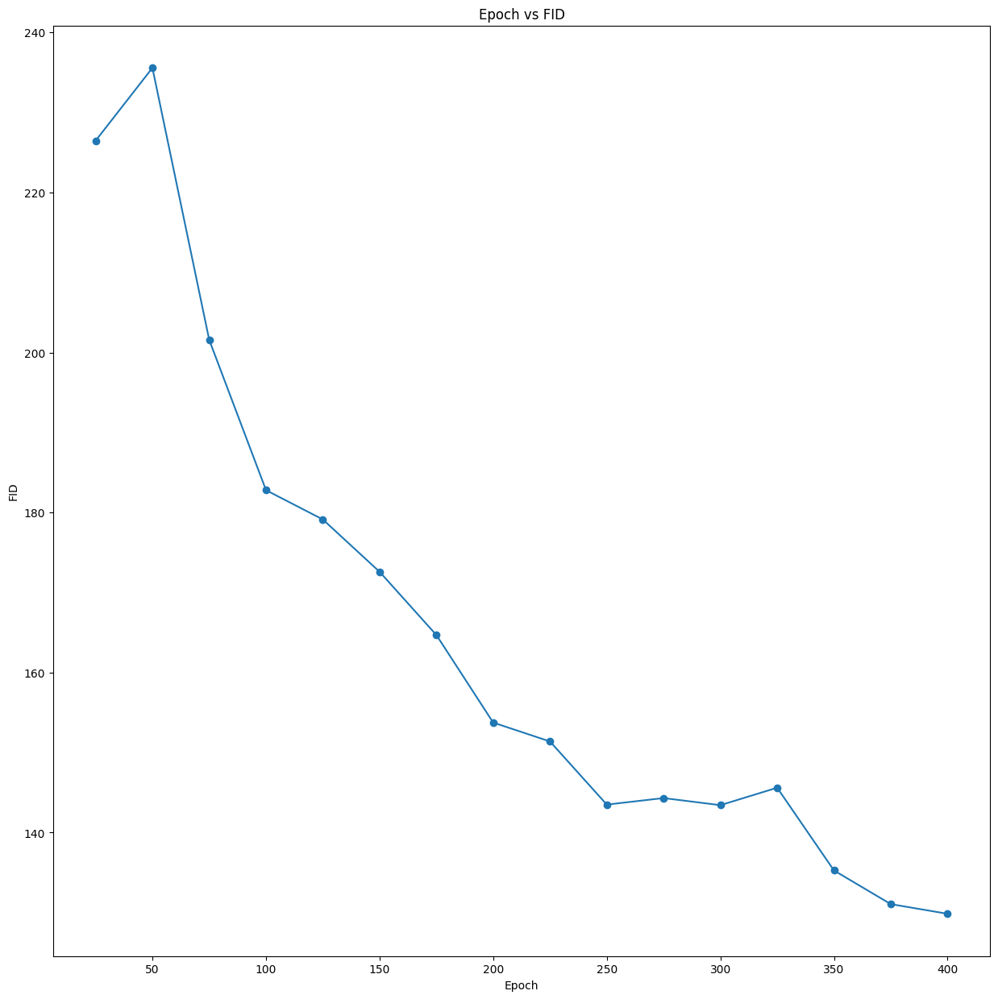

### Analysis of WGAN Results

Compared to the standard GAN los function, optimizing WGAN results in a lower FID of 129.8 compared to 131.8. Note that we are training the discriminator 5 times for every time the generator is trained as suggested by the authors of WGAN. In contrast, we were training the discriminator only 1 time for every time the generator was trained when optimizing the standard GAN loss. So can the lower FID soley be attributed to longer training of the discriminator?

No, because when we train the discriminator longer when optimizing the standard GAN objective, we noticed that the discriminator quickly became too strong, and its loss dropped to 0 early, making it difficult for the generator to improve. So WGAN can overcome this problem and allow for adversarial training that is benificial to both generator and discriminator.

### Images generated by WGAN

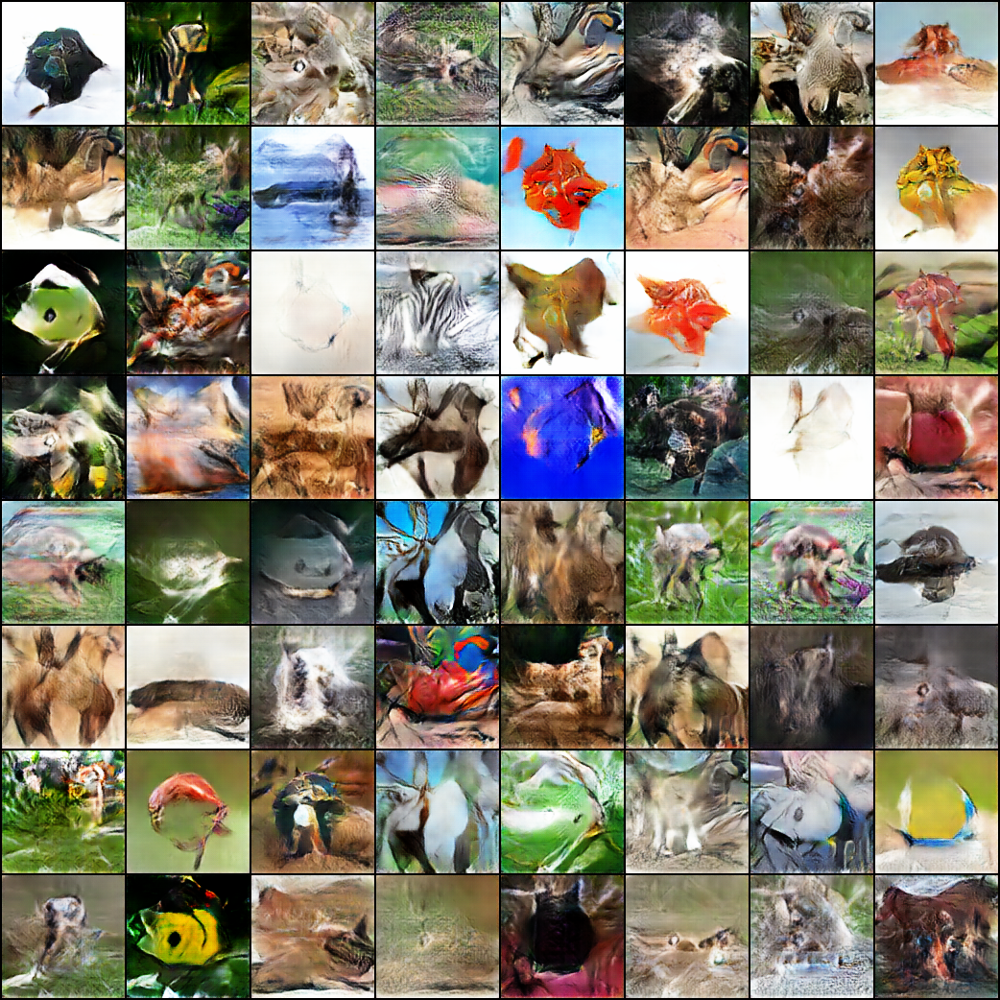

Compared to DC-GAN and StyleGAN with the standard GAN objectives, the images generated by WGAN are much more sharper with a more variety of colors. Notice the lack of distinct patches of color in places where animals should be. **Just as we can see castles in the sky if we stare hard enough into the clouds**, we see hints of a starfish (2nd row 5th column and 3rd row 6th column), a zebra (3rd row 4th column), a bat (8th row 5th column),  a penguin (5th row 4th column and 7th row 4th column), and a crab (6th row 4th column).

However, while WGAN in practice tends to reduce mode collapse, there are early signs of mode collapse present here. Upon close examination a diamond shaped eye is present in alomst the exact same location in images of 3rd row 1st column, 4th row 1st column, 7th row 7th column, and 8th row 2nd column. Even the two images of penguins look very similar to each other. Compared to the example of mode collapse produced by optimizing standard GAN objective, here the mode collapse seems to be on a much more smaller scale.

In addition, there are hints of patchwork (3rd row 7th column and 8th row 7th column) as well as whitening near the edges (4th row 2nd column and 4th row 5th column). The patches could result due to the random erasing augmentation which randomly adds rectangular patches of black to the image. Hence, the generator could be producing the image patch wise and not all at once. The whitening near the edges could be as a result of the affine transformation augmentation. Hence, the generator is modelling the augmented distribution to a small extent even after DiffAugment.



In the section, we create a Decoder model that tries to model the conditional probability of generating the input random variable in the GAN. We add a norm-based reconstruction loss between the input to the generator and the output of the decoder. Consider the standard GAN losses:

$$
L_{Disc} = \mathbb{E}_{x \sim \mathbb{P}_{x}} [\log D_w(T(x))] + \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\theta}} [\log(1 - D_w(\hat{x}))]
$$

$$
L_{Gen} = \mathbb{E}_{\hat{x} \sim \mathbb{P}_{\theta}} [\log(1 - D_w(\hat{x}))] 
$$

We alter the notation for the generator's loss function to sample a "noise" vector from the standard gaussian distribution. If $g_\theta(.)$ denotes the generator, the rewritten generator objective is:

$$
L_{Gen} = \mathbb{E}_{z \sim \mathcal{N}(0, I)} [\log(1 - D_w(g_\theta(z)))] 
$$

Then, we introduce a decoder, C, whose objective is to minimize the following loss:

$$
L_{Dec} = \mathbb{E}_{z \sim \mathcal{N}(0, I)} || z - C(g_\theta(z)) ||^2
$$


### Decoder Architecture

In order to provide a fair comparison with Q10, we experimented a ResNet based decoder. We simply replaced the last fully connected layer of a ResNet34 model (not pre-trained on ImageNet) with the same number of dimensions as the input random vector to the GAN.

In [ ]:
Dec_model = torchvision.models.resnet34(pretrained=False)
Dec_model.fc = nn.Linear(Dec_model.fc.in_features, z)
Dec_model.to(device)

In [ ]:
Gen_model = Generator().to(device)    
Gen_model.apply(weights_init) 

Disc_model = Discriminator(augment_module=augment_module).to(device) 
Disc_model.apply(weights_init)

### Hyperparameters for Decoder Training

| Hyperparameter  | Value        | Description                                    |
|-----------------|--------------|------------------------------------------------|
| `img_size`      | 128          | Size to resize images (128x128 pixels)         |
| `batch_size`    | 128          | Number of images per batch                     |
| `z`             | 100          | Dimensionality of the latent vector (input to the generator) |
| `gf`            | 64           | Size of feature maps in the generator          |
| `df`            | 64           | Size of feature maps in the discriminator      |
| `beta1`         | 0.5          | Beta1 hyperparameter for Adam optimizer        |
| `beta2`         | 0.999        | Beta2 hyperparameter for Adam optimizer        |
| `epochs`        | 400          | Number of training epochs                      |
| `disc_lr`       | 0.0002       | Learning rate for the discriminator            |
| `gen_lr`        | 0.0002       | Learning rate for the generator                |
| `dec_lr`        | 0.001        | Learning rate for the decoder                  |

In [ ]:
fixed_noise = torch.randn(64, z, 1, 1, device=device)
real_label = 1
fake_label = 0

disc_lr = 0.0002
gen_lr = 0.0002
dec_lr = 0.001

optimizerD = optim.Adam(Disc_model.parameters(), lr=disc_lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(Gen_model.parameters(), lr=gen_lr, betas=(beta1, 0.999))
optimizerDec = optim.Adam(Dec_model.parameters(), lr=dec_lr)

criterion = nn.BCELoss()
dec_criterion = nn.MSELoss()

iters = 0
num_epochs = 400
dec_losses = []
disc_losses = []
gen_loses = []
img_list = []

In [ ]:
if not os.path.exists("./decoder"):
    os.makedirs("./decoder")
print("Starting Training Loop...")

for epoch in range(1, num_epochs+1):
    
    for i,data in enumerate(dataloader, 0):
    
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        
        # update Disc model : maximize log(D(x)) + log(1 - D(G(z)))
        Disc_model.zero_grad()
        label = torch.full((b_size,), real_label, device=device, dtype=torch.float)
        output = Disc_model(real_cpu, noise_variance).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()
        
        noise = torch.randn(b_size, z, 1, 1, device=device)
        fake = Gen_model(noise)
        label.fill_(fake_label)
        output = Disc_model(fake.detach(), noise_variance).view(-1)
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()
        
        disc_losses.append(errD.item())
            
        # update Gen model : maximize log(D(G(z)))
        Gen_model.zero_grad()
        label.fill_(real_label)
        output = Disc_model(fake, noise_variance).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        gen_losses.append(errG.item())

        Dec_model.zero_grad()
        output = Dec_model(fake.detach())
        errDec = dec_criterion(output, noise.view(output.shape))
        errDec.backward()
        optimizerDec.step()

        dec_losses.append(errDec.item())
            
    
        if i % 10 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                    % (epoch, num_epochs, i, len(dataloader),
                        errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
            
        if (iters)%500 == 0 or (i == len(dataloader)-1) or (epoch == num_epochs):
            with torch.no_grad():
                fake = Gen_model(fixed_noise).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            
            if not os.path.exists("./decoder/generated_animals"):
                os.makedirs("./decoder/generated_animals")
            
            plt.imsave(f"./decoder/generated_animals/{epoch}_{iters}.png",img_list[-1].numpy().transpose(1,2,0))
            
        iters += 1
        
    if epoch%25 == 0:
        if not os.path.exists("./decoder/models"):
            os.makedirs("./decoder/models")
            
        torch.save(Gen_model.state_dict(), f"./decoder/models/gen_{epoch}.pth")
        torch.save(Disc_model.state_dict(), f"./decoder/models/disc_{epoch}.pth")

### Loss Visualization

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Generator, Discriminator, and Decoder Loss During Training")
plt.plot(gen_losses,label="Gen")
plt.plot(disc_losses,label="Disc")
plt.plot(dec_losses,label="Dec")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

*Generator, Discriminator, and Decoder Loss while training
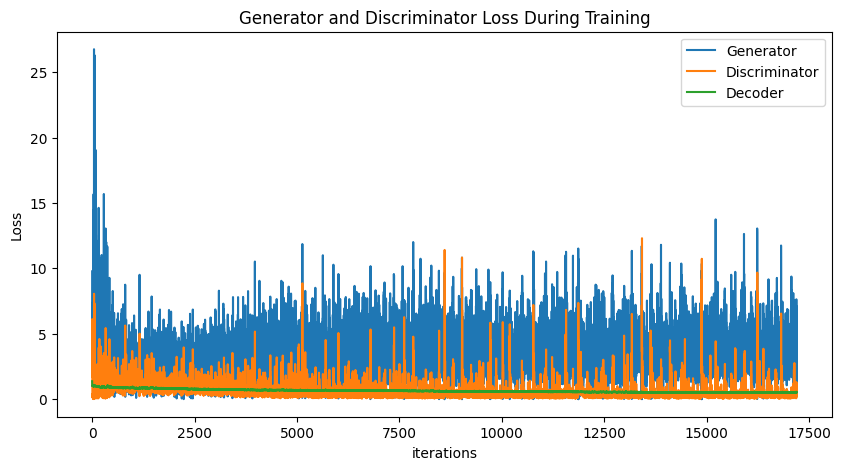

### TSNE plot of decoder latents

In [ ]:
from sklearn.manifold import TSNE

def tsne_plot(classes):
    idx1 = [i for i in range(len(dataset)) if dataset.imgs[i][1] == dataset.class_to_idx[classes[0]]]
    dataset1 = Subset(dataset, idx1)

    idx2 = [i for i in range(len(dataset)) if dataset.imgs[i][1] == dataset.class_to_idx[classes[1]]]
    dataset2 = Subset(dataset, idx2)

    idx3 = [i for i in range(len(dataset)) if dataset.imgs[i][1] == dataset.class_to_idx[classes[2]]]
    dataset3 = Subset(dataset, idx3)

    dataloader1 = DataLoader(dataset1, batch_size=64, shuffle=True, num_workers=4)
    dataloader2 = DataLoader(dataset2, batch_size=64, shuffle=True, num_workers=4)
    dataloader3 = DataLoader(dataset3, batch_size=64, shuffle=True, num_workers=4)

    class1 = []
    for i,data in enumerate(dataloader1, 0):
        images, labels = data[0].to(device), data[1].to(device) 
        latents = Dec_model(images)
        class1 = np.array(latents.detach().cpu())

    class2 = []
    for i,data in enumerate(dataloader2, 0):
        images, labels = data[0].to(device), data[1].to(device) 
        latents = Dec_model(images)
        class2 = np.array(latents.detach().cpu())

    class3 = []
    for i,data in enumerate(dataloader3, 0):
        images, labels = data[0].to(device), data[1].to(device) 
        latents = Dec_model(images)
        class3 = np.array(latents.detach().cpu())

    print(class1.shape, class2.shape, class3.shape)

    # Combine the data
    embeddings = np.vstack((class1, class2, class3))

    # Create labels for the 3 classes
    labels = np.array([0]*len(class1) + [1]*len(class2) + [2]*len(class3))

    # Run t-SNE to reduce to 2 dimensions
    tsne = TSNE(n_components=2, random_state=42)
    embeddings_2d = tsne.fit_transform(embeddings)

    # Plot the t-SNE results
    plt.figure(figsize=(8, 6))
    for i, label in enumerate(np.unique(labels)):
        plt.scatter(embeddings_2d[labels == label, 0], embeddings_2d[labels == label, 1], label=classes[i], alpha=0.6)
    plt.legend()
    plt.title('t-SNE Plot of Embeddings')
    plt.xlabel('t-SNE Dimension 1')
    plt.ylabel('t-SNE Dimension 2')
    plt.show()

We take 3 classes of animals at a time and plot the TSNE of decoder latents. The first three classes are - Lion, Bat, and Whale. All of these correspond to three distinct forms of life. From the TSNE plot, it is quite evident that the decoder has learnt disctint representations of these three classes.

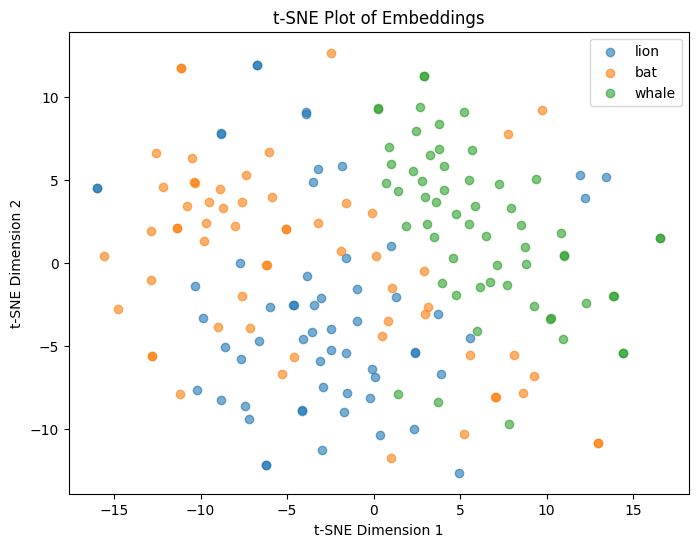

Next, we consider three classes that all correspond to aquatic life - Dolphin, Shark, and Whale. From the TSNE plot, we observe that the decoder representations of these three classes are very similar to each other.

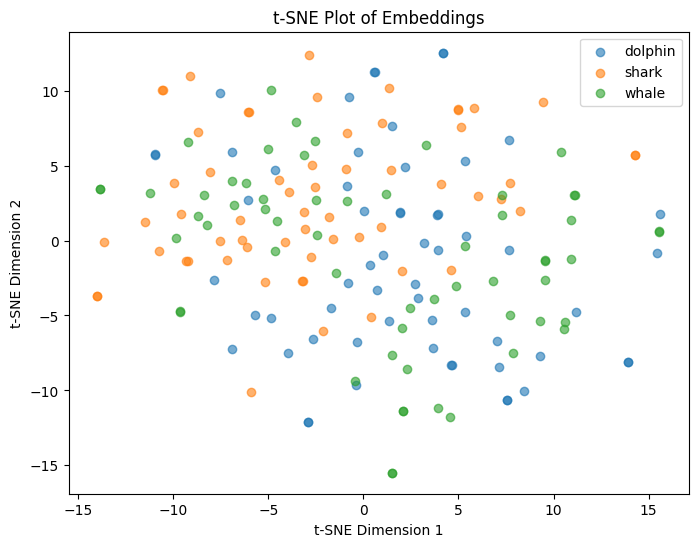

Here we use a simple 3 layer MLP that will take as input the decoded latents and learn the class to which the decoded latent belongs to. Between each layer, we used the RelU activation function.

In [ ]:
num_classes = 90

In [ ]:
class MLP(nn.Module):
    def __init__(self):
        super(MLP, self).__init__()
        self.layers = nn.Sequential(
            nn.Linear(100, 256),
            nn.ReLU(),
            nn.Linear(256, 128),
            nn.ReLU(),
            nn.Linear(128, num_classes)
        )
        
    def forward(self, x):
        x = x.view(x.size(0), -1)
        x = self.layers(x)
        return x

In [ ]:
def evaluate_model(model, dataloader):
    model.eval()
    all_preds, all_labels = [], []
    correct_predictions = 0
    with torch.no_grad():
       for i,data in enumerate(dataloader, 0):
            images, labels = data[0].to(device), data[1].to(device)
            mlp_inputs = Dec_model(images)
            outputs = model(mlp_inputs) 
            _, predictions = torch.max(outputs, 1)
            correct_predictions += (predictions == labels).sum().item()
            all_labels.extend(labels.cpu())
            all_preds.extend(predictions.cpu())

    f1 = f1_score(all_labels, all_preds, average='macro')
    accuracy = correct_predictions/len(all_labels)
    return f1, accuracy

### Hyperparameters for MLP Model

| Hyperparameter  | Value        | Description                                    |
|-----------------|--------------|------------------------------------------------|
| `batch_size`    | 128          | Number of latents per batch                    |
| `z`             | 100          | Dimensionality of the latent vector (input to the MLP) |
| `epochs`        | 40           | Number of training epochs                      |
| `lr`            | 0.001        | Learning rate for the MLP                      |

In [ ]:
model = MLP()
model.to(device)

lr = 1e-3
optimizer = optim.Adam(model.parameters(), lr=lr)
criterion = torch.nn.CrossEntropyLoss()

losses = [] 
accuracies = []
num_epochs=40
best_accuracy, best_f1 = 0, 0
best_model = None

In [ ]:
if not os.path.exists("./mlp"):
    os.makedirs("./mlp")
print("Starting Training Loop...")
Dec_model.eval() # Don't backpropagate the loss to the decoder since the latents must be fixed
for epoch in range(1, num_epochs+1):
    model.train()
    running_loss = []
    for i,data in enumerate(dataloader, 0):
        images, labels = data[0].to(device), data[1].to(device) 
        b_size = images.size(0)   
        model.zero_grad()
        with torch.no_grad():
            mlp_inputs = Dec_model(images)
        outputs = model(mlp_inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss.append(loss.item())

    epoch_f1, epoch_acc = evaluate_model(model, dataloader)
    epoch_loss = np.mean(running_loss)
    losses.append(epoch_loss)
    accuracies.append(epoch_acc)

    print(f"Epoch {epoch}/{num_epochs}: Loss = {epoch_loss}. Accuracy = {epoch_acc}. F1-Score = {epoch_f1}")
    if(epoch_acc > best_accuracy):
        best_accuracy = epoch_acc
        best_f1 = epoch_f1
        best_model = copy.deepcopy(model)

print("Best Accuracy = ", best_accuracy * 100, ", corresponding F1-score = ", best_f1 * 100)
torch.save(best_model.state_dict(), f"/home/sriram/ADRL/mlp/model.pth")

Best Accuracy = 98.22222222222222, corresponding F1-Score = 98.21985549653891

In [ ]:
plt.figure(figsize=(10,5))
plt.title("MLP Loss During Training")
plt.plot(losses)
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.show()

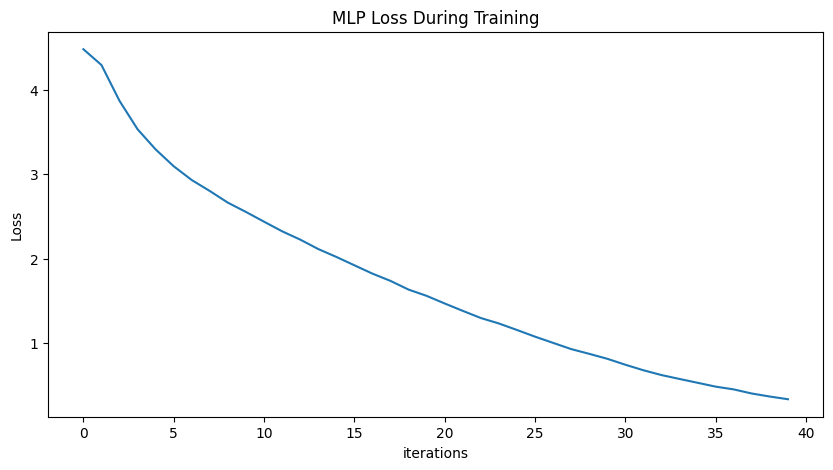

In [ ]:
plt.figure(figsize=(10,5))
plt.title("MLP Accuracy During Training")
plt.plot(accuracies)
plt.xlabel("iterations")
plt.ylabel("Accuracy")
plt.show()

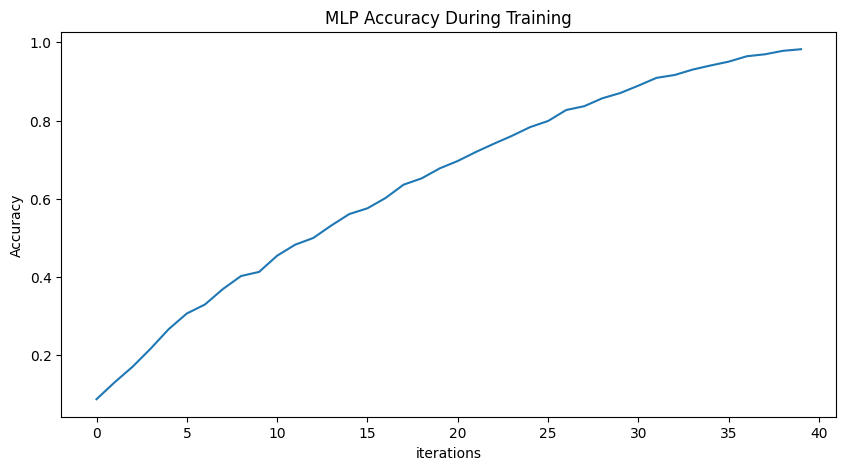

### Importance of ResNet based Decoder Architecture
Apart from the ResNet based decoder, we also experimented with a decoder based on the architecture of the Discriminator itself. We removed the Discriminator's sigmoid and last convolutional layer and added a linear layer that would aim to learn the input random vector to the GAN. However, this training resulted in very poor representations of the decoder. Specifically, the model accuracy did not go above 10%. Hence, we stuck with the ResNet based decoder.

### Importance of RelU activations in the MLP
Coming to the MLP, we found the inclusion of RelU to be very important in model convergence. Without RelU, the MLP was underfitting and could not get better than 46% accuracy.

In [ ]:
model = torchvision.models.resnet34(pretrained=True)
for param in model.parameters():
    param.requires_grad = False
#model.conv1 = nn.Conv2d(3, 128, kernel_size=3, stride=1, padding=1, bias=False)
num_features = model.fc.in_features
model.fc = nn.Linear(num_features, num_classes)
model.fc.requires_grad = True
model.to(device)

### Hyperparameters for pre-trained ResNet Model

| Hyperparameter  | Value        | Description                                    |
|-----------------|--------------|------------------------------------------------|
| `batch_size`    | 128          | Number of latents per batch                    |
| `epochs`        | 20           | Number of training epochs                      |
| `lr`            | 0.001        | Learning rate for ResNet                       |

In [ ]:
losses = [] 
accuracies = []
num_epochs=20
best_accuracy, best_f1 = 0, 0
best_model = None

optimizer = optim.Adam(model.parameters(), lr=lr)
criterion = torch.nn.CrossEntropyLoss()

In [ ]:
if not os.path.exists("./resnet"):
    os.makedirs("./resnet")
print("Starting Training Loop...")
Dec_model.eval() # Don't backpropagate the loss to the decoder since the latents must be fixed
for epoch in range(1, num_epochs+1):
    model.train()
    running_loss = []
    for i,data in enumerate(dataloader, 0):
        images, labels = data[0].to(device), data[1].to(device) 
        b_size = images.size(0)   
        model.zero_grad()
        outputs = model(images)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()
        running_loss.append(loss.item())

    epoch_f1, epoch_acc = evaluate_model(model, dataloader)
    epoch_loss = np.mean(running_loss)
    losses.append(epoch_loss)
    accuracies.append(epoch_acc)

    print(f"Epoch {epoch}/{num_epochs}: Loss = {epoch_loss}. Accuracy = {epoch_acc}. F1-Score = {epoch_f1}")
    if(epoch_acc > best_accuracy):
        best_accuracy = epoch_acc
        best_f1 = epoch_f1
        best_model = copy.deepcopy(model)

print("Best Accuracy = ", best_accuracy * 100, ", corresponding F1-score = ", best_f1 * 100)
torch.save(best_model.state_dict(), f"/home/sriram/ADRL/resnet/model.pth")

Best Accuracy = 99.29629629629629, corresponding F1-Score = 99.30094433521889

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Resnet Loss During Training")
plt.plot(losses)
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.show()

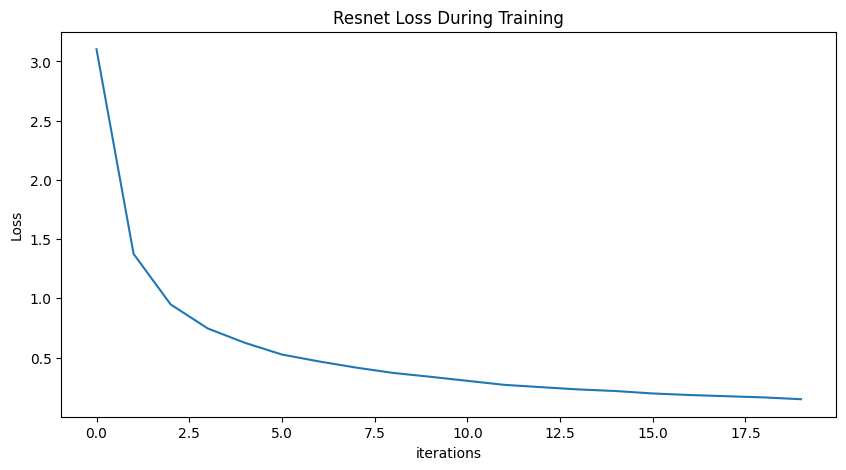

In [ ]:
plt.figure(figsize=(10,5))
plt.title("Resnet Accuracy During Training")
plt.plot(accuracies)
plt.xlabel("iterations")
plt.ylabel("Accuracy")
plt.show()

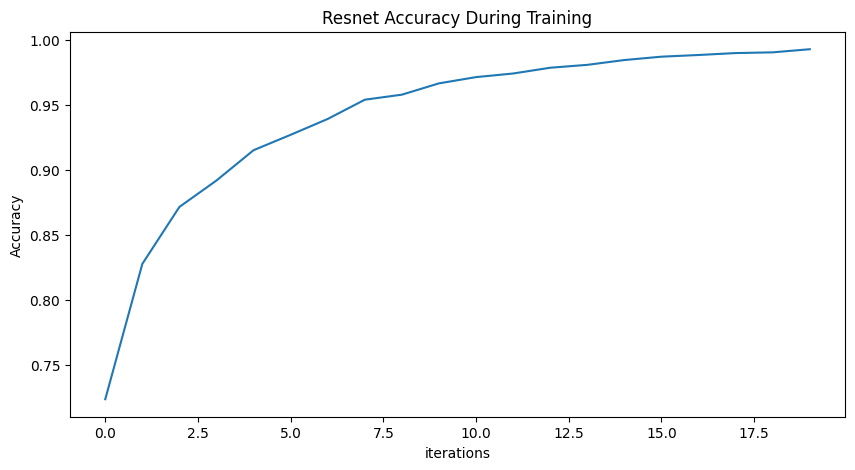

### Analysis: MLP vs pre-trained ResNet

Within a single epoch, the pre-trained ResNet overtakes the results of the MLP achieved in its first 21 epochs. The MLP breaks the 90% accuracy and F1-score mark on the 30th epoch of training. The pre-trained ResNet does the same in the 5th epoch. Within 15 epochs, the pre-trained ResNet overtakes the best accuracy and F1-score achieved by the MLP.

This implies that the decoder latents are not enough to capture the entire information about the input images compared to a pre-trained ResNet. This is likely because our generator itself is unable to produce images that mimic the true data distribution. As a consequence, our decoder can only get as good as the generator allows it to. 

Essentially, the starting point offered by the decoder latents is not as good as the starting point offered by pre-training on ImageNet. ImageNet contains 14 million images and so the pre-training there is much more powerful than pre-training on only 5,400 images in the Animals dataset.

Implement conditional generation by randomly choosing 20 subclasses in
the data

##  `AnimalsDataset` Class for conditional generation

In [2]:
class AnimalsDataset(datasets.VisionDataset):
    def __init__(self, root, transform=None, target_transform=None, train=True):
        super(AnimalsDataset, self).__init__(root, transform=transform, target_transform=target_transform)
        self.train = train
        self.data = []
        self.targets = []
        
        self.classes = ['eagle', 'turtle', 'pigeon', 'sparrow', 'deer', 'elephant', 'hippopotamus', 
                        'dragonfly', 'mosquito', 'butterfly', 'snake', 'horse', 'bison', 
                        'parrot', 'orangutan', 'possum', 'flamingo', 'sandpiper', 'rat', 'coyote']
        
        
        self.class_to_idx = {}
        self.idx_to_class = {}
        self.transform = transform
        self.target_transform = target_transform
        self.class_counts = {class_name: 0 for class_name in self.classes}
        
        for i, d in enumerate(self.classes):
            self.class_to_idx[d] = i
            self.idx_to_class[i] = d
            for img in os.listdir(os.path.join(root, d)):
                self.data.append(os.path.join(root, d, img))
                self.targets.append(i)
                self.class_counts[d] += 1
 
 
    def __getitem__(self, index):
        img_path, target = self.data[index], self.targets[index]
        img = Image.open(img_path).convert('RGB')
 
        if self.transform is not None:
            img = self.transform(img)
 
        return img, target
 
    def __len__(self):
        return len(self.data)
 
    def get_class_counts(self):
        return self.class_counts

In [3]:
lr = 0.0002
batch_size = 128
num_epochs = 400
z=100 
embed_size = 30
workers = 8 
gf = 64 
df = 64 
beta1 = 0.5
beta2 = 0.999 

### Explanations for Conditional GAN Training Hyperparameters:

| **Hyperparameter** | **Value** | **Description** |
|--------------------|-----------|-----------------|
| `img_size`         | 128       | The size (width and height) of the input images. Here, images are 128x128 pixels. |
| `batch_size`       | 128       | Number of samples to process in one iteration of training. |
| `lr`               | 0.0002    | The learning rate, which controls how much to adjust the model's weights with respect to the loss gradient during training. |
| `num_epochs`       | 400       | The total number of times the entire training dataset is passed through the model during training. |
| `z`                | 100       | The dimensionality of the noise vector input to the generator, used to generate the image. |
| `embed_size`       | 30        | The size of the embedding for class labels, which conditions the generator and discriminator on class labels. |
| `workers`          | 8         | Number of subprocesses to use for data loading. This improves the speed of data loading. |
| `gf`               | 64        | Size of feature maps in the generator
| `df`               | 64        | Size of feature maps in the discriminator
| `beta1`            | 0.5       | The decay rate for the first moment (mean) estimates in the Adam optimizer. |
| `beta2`            | 0.999     | The decay rate for the second moment (variance) estimates in the Adam optimizer. |


Training samples for class eagle: 60
Training samples for class turtle: 60
Training samples for class pigeon: 60
Training samples for class sparrow: 60
Training samples for class deer: 60
Training samples for class elephant: 60
Training samples for class hippopotamus: 60
Training samples for class dragonfly: 60
Training samples for class mosquito: 60
Training samples for class butterfly: 60
Training samples for class snake: 60
Training samples for class horse: 60
Training samples for class bison: 60
Training samples for class parrot: 60
Training samples for class orangutan: 60
Training samples for class possum: 60
Training samples for class flamingo: 60
Training samples for class sandpiper: 60
Training samples for class rat: 60
Training samples for class coyote: 60


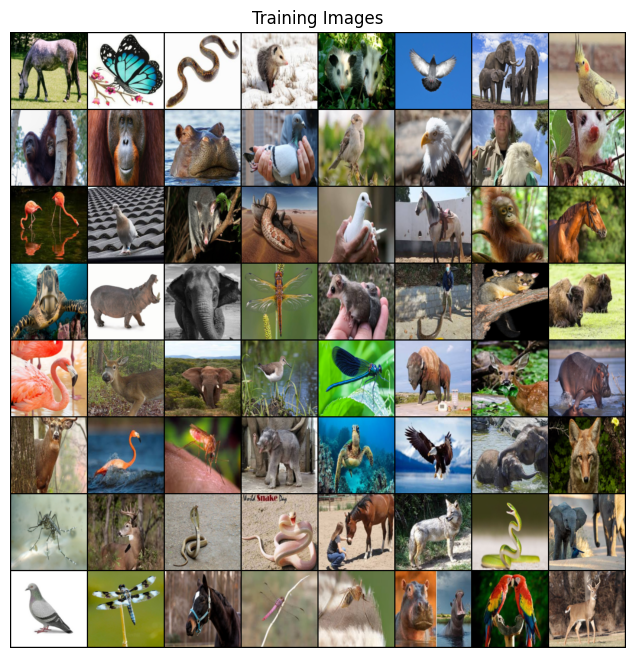

In [5]:
def seconds_to_hms(seconds):
    m, s = divmod(seconds, 60)
    h, m = divmod(m, 60)
    return "%d hr:%02d min:%02d sec" % (h, m, s)
 
transform = transforms.Compose([
    transforms.Resize((img_size, img_size)),
    transforms.ToTensor(),
    transforms.Normalize(
        [0.5 for _ in range(3)], [0.5 for _ in range(3)]
    ),
])

train_dataset = AnimalsDataset(root=data_dir, transform=transform, train=True)
dataloader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True, num_workers=workers)
 
train_class_counts = train_dataset.get_class_counts()
for class_name, count in train_class_counts.items():
    print(f"Training samples for class {class_name}: {count}")

real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))

### Generator Model

The ConditionalGenerator class defines the generator in a Conditional Generative Adversarial Network. This model generates images conditioned on class labels by combining random noise with label embeddings.

- The labels are embedded into a vector using the embedding layer.
- The noise and label embedding are concatenated along the channel dimension.
- The combined input is passed through the generator network , which transforms it into an image.


The `ConditionalGenerator` generates images conditioned on class labels by combining random noise with label embeddings:

1. **Label Embedding**:
   - The label $y $ is embedded into a vector $e_y $:
   $$ 
   e_y = \text{Embed}(y)
   $$

2. **Concatenation of Noise and Label Embedding**:
   - The noise $z $ is concatenated with the embedded label $e_y $:
$$
   z_y = [z; e_y]
  $$

3. **Generation of Image**:
   - The combined input $z_y $ is passed through the generator $G $ to generate an image $\hat{x} $:
$$
   \hat{x} = G(z_y)
  $$

In short:
$$
\hat{x} = G([z; \text{Embed}(y)])
$$


In [4]:
class ConditionalGenerator(nn.Module):
    def __init__(self,num_classes=20, embed_size=embed_size, z=z): 
        super(ConditionalGenerator, self).__init__()  
        self.gen = nn.Sequential(
            nn.ConvTranspose2d(in_channels=z+embed_size, out_channels=gf*16, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(gf*16),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=gf*16, out_channels=gf*8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(gf*8),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=gf*8, out_channels=gf*4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(gf*4),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=gf*4, out_channels=gf*2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(gf*2),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=gf*2, out_channels=gf, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(gf),
            nn.ReLU(True),
            
            nn.ConvTranspose2d(in_channels=gf, out_channels=3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh() 
        )
        
        self.embed = nn.Embedding(num_classes, embed_size)

    def forward(self, input,labels):
        embedd = self.embed(labels).unsqueeze(2).unsqueeze(3)
        input = torch.cat([input,embedd],1)
        return self.gen(input)

In [7]:
Gen_model = ConditionalGenerator(num_classes=20,embed_size=embed_size,z=z).to(device)

if (device.type == 'cuda') and (ngpu > 1):
    Gen_model = nn.DataParallel(Gen_model, device_ids=[0, 1,2])
    
Gen_model.apply(weights_init)

ConditionalGenerator(
  (gen): Sequential(
    (0): ConvTranspose2d(130, 1024, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(1024, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace=True)
    (3): ConvTranspose2d(1024, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace=True)
    (6): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace=True)
    (9): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace=True)
    (12): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1

### Discriminator Model 

- The labels are passed through the embedding layer, which flattens the label into a 2D matrix matching the image size.
- The embedded label is reshaped using and concatenated with the input image along the channel dimension.
- The combined input (image + label) is passed through the optional augmentation module .
- The augmented input is then passed through the discriminator network, which classifies it as real or generated.

1. **Label Embedding**:
   - The label $y$ is embedded into a 2D matrix $E_y$ matching the image size:
   $$
   E_y = \text{Embed}(y) \quad \text{where} \quad E_y \in \mathbb{R}^{1 \times \text{img\_size} \times \text{img\_size}}
   $$

2. **Concatenation of Image and Label**:
   - The embedded label matrix $E_y$ is concatenated with the input image $x$:
   $$
   x_y = [x; E_y] \quad \text{where} \quad x_y \in \mathbb{R}^{(3+1) \times \text{img\_size} \times \text{img\_size}}
   $$

3. **Augmentation (Optional)**:
   - The combined input $x_y$ is passed through the augmentation module:
   $$
   x_y' = \text{Augment}(x_y)
   $$

4. **Discriminator Classification**:
   - The augmented input is passed through the discriminator $D$, which outputs a probability $p$ indicating whether the image is real or generated:
   $$
   p = D(x_y')
   $$

      In short:
            $$
            p = D(\text{Augment}([x; \text{Embed}(y)]))
            $$



In [8]:
class ConditionalDiscriminator(nn.Module):
    def __init__(self,num_classes=20,img_size=128, augment_module=None):
        super(ConditionalDiscriminator, self).__init__()
        self.disc = nn.Sequential(
            nn.Conv2d(in_channels=3+1, out_channels=df, kernel_size=4, stride=2, padding=1, bias=False), 
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df, out_channels=df*2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(df*2),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df*2, out_channels=df*4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(df*4),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df*4, out_channels=df*8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(df*8),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df*8, out_channels=df*16, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(df*16),
            nn.LeakyReLU(0.2, inplace=True),
            
            nn.Conv2d(in_channels=df*16, out_channels=1, kernel_size=4, stride=1, padding=0, bias=False),
            nn.Sigmoid()
        )
        
        self.embed = nn.Embedding(num_classes, img_size*img_size)
        if augment_module is not None:
            self.augment_module = augment_module
        else:
            self.augment_module = nn.Identity()

    def forward(self, input, labels):
        embed = self.embed(labels).view(labels.size(0),1,img_size,img_size)
        input = torch.cat([input,embed],1)
        input = self.augment_module(input)
        return self.disc(input)

In [9]:
mosaic_kwargs = {"nrow": 10, "normalize": True}
n_mosaic_cells = 10 * 10
 
augment_module = torch.nn.Sequential(
    K.RandomAffine(degrees=0, translate=(1 / 8, 1 / 8), p=0.9),
    K.RandomErasing((0.0, 0.2), p=0.9),
)

Disc_model = ConditionalDiscriminator(augment_module=augment_module).to(device)
if (device.type == 'cuda') and (ngpu > 1):
    Disc_model = nn.DataParallel(Disc_model, device_ids=[0, 1,2])
    
Disc_model.apply(weights_init) 


ConditionalDiscriminator(
  (disc): Sequential(
    (0): Conv2d(4, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Conv2d(512, 1024, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (12): BatchNorm2d(1024

In [10]:
criterion = nn.BCELoss()

fixed_noise = torch.randn(128, z, 1, 1, device=device)

real_label = 1
fake_label = 0

optimizerD = optim.Adam(Disc_model.parameters(), lr=lr, betas=(beta1, beta2))
optimizerG = optim.Adam(Gen_model.parameters(), lr=lr, betas=(beta1, beta2))

critic_iters = 5

### Training Conditional GAN

The training involves a **minimax two-player game** between:
- The **generator** \( $G$ \), which tries to generate realistic data conditioned on \( $y$ \), and
- The **discriminator** \( $D$ \), which tries to distinguish between real data and data generated by \( $G$ \), both conditioned on \( $y$ \).

#### Steps:
1. **Generator \( $G(z|y)$ \)**:
   - Takes random noise \( $z$ \) from a prior distribution \( $p_z(z)$ \) and a label \( $y$ \), and generates a data sample \( $G(z|y)$ \) (image).

2. **Discriminator \( $D(x|y)$ \)**:
   - Receives a data sample \( $x$ \) (either real from the dataset or fake from the generator) along with the label \( $y$ \), and tries to determine whether the data is real or generated.

3. **Objective**:
   - The generator aims to **minimize** the probability that the discriminator successfully identifies the generated data as fake.
   - The discriminator aims to **maximize** the probability of correctly distinguishing between real and generated data.

#### Training Objective (Minimax Game):
The objective function for the two-player minimax game is defined as:

<!-- \[ -->
$$
\min_G \max_D V(D, G) = \mathbb{E}_{x \sim p_{data}(x)}[\log D(x|y)] + \mathbb{E}_{z \sim p_z(z)}[\log(1 - D(G(z|y)))]
$$
<!-- \] -->

Where:
- $D(x|y)$ : The discriminator’s output probability that the data \( $x$ \), conditioned on \( $y$ \), is real.
- $G(z|y)$ : The generator’s output, which is a data sample created from the noise \( $z$ \) and label \( $y$ \).
- $p_{data}(x)$ : The real data distribution.
- $p_z(z)$ : The prior distribution of the noise input.


#### Training Process:
1. **Step 1 (Discriminator Training)**:
   - Sample real data \( $x$ \) and corresponding label \( $y$ \).
   - Sample noise \( $z$ \) from the prior distribution \( $p_z(z)$ \) and generate a sample \( $G(z|y)$ \) from the generator.
   - Update the discriminator by maximizing \( $\log D(x|y) + \log(1 - D(G(z|y)))$ \).

2. **Step 2 (Generator Training)**:
   - Sample noise \( $z$ \) and label \( $y$ \).
   - Generate a fake data sample \( $G(z|y)$ \) and pass it to the discriminator.
   - Update the generator by minimizing \( $\log(1 - D(G(z|y)))$ \), which is equivalent to maximizing \( $\log D(G(z|y))$ \) to fool the discriminator.

3. **Step 3**:
   - Alternate between updating the discriminator and the generator until the model converges (or stops based on other criteria such as validation performance).

In [11]:
img_list = []
gen_losses = [] 
disc_losses = []
iters = 0

for epoch in range(num_epochs):
    for i,data in enumerate(dataloader, 0):
    
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)   
        Disc_model.zero_grad()
        label = torch.full((b_size,), real_label, device=device, dtype=torch.float)
                
        output = Disc_model(real_cpu, data[1].to(device)).view(-1)
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()
        
        noise = torch.randn(b_size, z, 1, 1, device=device)
        fake = Gen_model(noise, data[1].to(device)) 
        label.fill_(fake_label)
        output = Disc_model(fake.detach(),  data[1].to(device)).view(-1)

        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()
            
        disc_losses.append(errD.item())
            
        Gen_model.zero_grad()
        label.fill_(real_label)
        output = Disc_model(fake, data[1].to(device)).view(-1)
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()
        
        gen_losses.append(errG.item())
    
        if i % 10 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                    % (epoch+1, num_epochs, i, len(dataloader),
                        errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))
        
        num_classes = 20
        if (iters)%500 == 0 or (i == len(dataloader)-1) or (epoch == num_epochs-1):
            
            
            with torch.no_grad():
                fake_labels = torch.randint(0,num_classes,(fixed_noise.size(0),),device=device)
                fake = Gen_model(fixed_noise,fake_labels).detach().cpu()
            img_list.append(vutils.make_grid(fake, padding=2, normalize=True))
            if not os.path.exists("conditional_animal_images_20classes"):
                os.mkdir("conditional_animal_images_20classes")
            plt.imsave(f"conditional_animal_images_20classes/{epoch}_{iters}.png", img_list[-1].numpy().transpose((1,2,0)))
            
        iters += 1
        
    if epoch%25 == 0:
        if not os.path.exists("conditional_models_20classes"):
            os.mkdir("conditional_models_20classes")
        torch.save(Gen_model.state_dict(), f"conditional_models_20classes/gen_{epoch}.pth")
        torch.save(Disc_model.state_dict(), f"conditional_models_20classes/disc_{epoch}.pth")
        

/data3/home/yaswanthk/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:456: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv2d(input, weight, bias, self.stride,
/data3/home/yaswanthk/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:952: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv_transpose2d(
/data3/home/yaswanthk/.local/lib/python3.10/site-packages/torch/autograd/graph.py:744: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at

[1/400][0/10]	Loss_D: 2.3173	Loss_G: 0.0053	D(x): 0.2622	D(G(z)): 0.3140 / 0.9949
[2/400][0/10]	Loss_D: 0.4370	Loss_G: 2.8706	D(x): 0.8306	D(G(z)): 0.1173 / 0.1637
[3/400][0/10]	Loss_D: 0.0843	Loss_G: 5.1054	D(x): 0.9682	D(G(z)): 0.0420 / 0.0347
[4/400][0/10]	Loss_D: 0.1204	Loss_G: 9.7189	D(x): 0.9737	D(G(z)): 0.0731 / 0.0011
[5/400][0/10]	Loss_D: 3.8750	Loss_G: 16.2793	D(x): 0.3887	D(G(z)): 0.0005 / 0.0252
[6/400][0/10]	Loss_D: 1.7203	Loss_G: 9.1749	D(x): 0.6309	D(G(z)): 0.0046 / 0.0314
[7/400][0/10]	Loss_D: 1.4244	Loss_G: 14.2862	D(x): 0.9382	D(G(z)): 0.3886 / 0.0001
[8/400][0/10]	Loss_D: 0.1383	Loss_G: 7.9667	D(x): 0.9525	D(G(z)): 0.0473 / 0.0053
[9/400][0/10]	Loss_D: 0.0251	Loss_G: 8.8331	D(x): 0.9830	D(G(z)): 0.0046 / 0.0024
[10/400][0/10]	Loss_D: 1.9969	Loss_G: 5.2619	D(x): 0.4802	D(G(z)): 0.1543 / 0.1498
[11/400][0/10]	Loss_D: 0.5517	Loss_G: 4.8618	D(x): 0.8027	D(G(z)): 0.1086 / 0.0313
[12/400][0/10]	Loss_D: 0.3756	Loss_G: 8.4812	D(x): 0.8540	D(G(z)): 0.1075 / 0.0055
[13/400][0/

### Plotting the loss curves for the Generator and Critic network.

X-axis: Iteration
 
Y-axis: Loss values


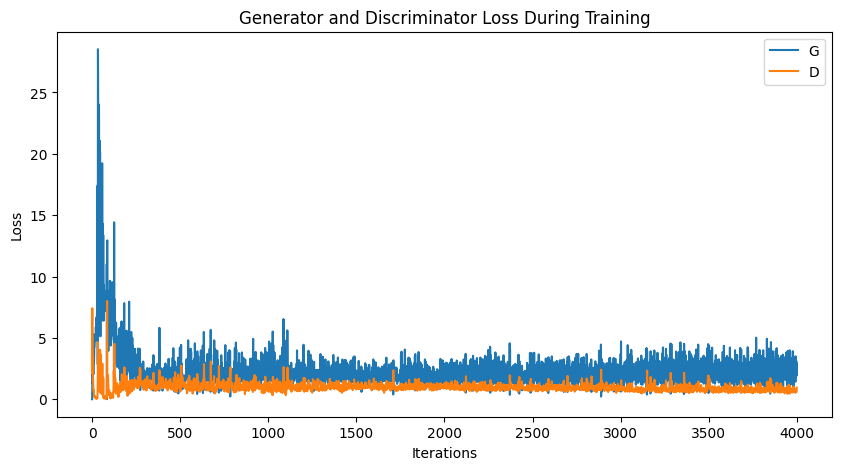

In [12]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(gen_losses,label="G")
plt.plot(disc_losses,label="D")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

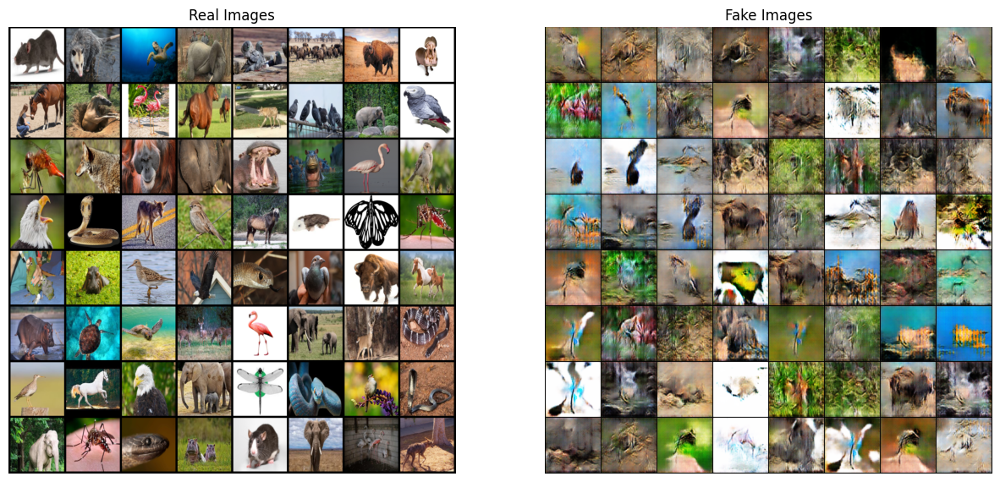

In [13]:
real_batch = next(iter(dataloader))

plt.figure(figsize=(15,15))
plt.subplot(1,2,1)
plt.axis("off")
plt.title("Real Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=5, normalize=True).cpu(),(1,2,0)))

plt.subplot(1,2,2)
plt.axis("off")
plt.title("Fake Images")
plt.imshow(np.transpose(vutils.make_grid(fake[:64], padding=2, normalize=True).cpu(),(1,2,0)))

plt.show()

### Compute Fréchet Inception Distance (FID) between 1000 Real and Fake images for all 20 Classes.

In [5]:
torch_fidelity.defaults.DEFAULTS['samples_find_deep'] = True
netG = ConditionalGenerator(num_classes=20, embed_size=embed_size, z=z).to(device)

num_images = 1000
batch_size = 100
num_batches = num_images//batch_size
fids = {}

for epoch in range(0,900,100):
    print(epoch)
    # netG.load_state_dict(torch.load(f'conditional_models_20classes/gen_{epoch}.pth'))
    netG.load_state_dict(torch.load(f'conditional_models_20classes copy/gen_{875}.pth'))
    for i in range(num_batches):
        noise = torch.randn(batch_size, z, 1, 1, device=device)
        labels = torch.randint(0,20,(batch_size,),device=device)
        gen_samples = netG(noise, labels).detach().cpu()
        for id, sample in enumerate(gen_samples):
            sample = sample.view(3,
                                128,
                                128)
            sample = (sample/2.0 + 0.5).clip(0,1)
            if not os.path.exists('cond_gen20'):
                os.mkdir('cond_gen20')
            save_image(sample, os.path.join('cond_gen20', 'sample_{}.jpg'.format(i*batch_size + id)))

    metrics_dict = torch_fidelity.calculate_metrics(
    input1='cond_gen_20', 
    input2='compare_animals_20_classes', 
    cuda=True, 
    isc=True, 
    fid=True, 
    kid=True, 
    prc=True, 
    verbose=False,
    )
    fids[epoch] = metrics_dict['frechet_inception_distance']


0


/data3/home/yaswanthk/.local/lib/python3.10/site-packages/torch/nn/modules/conv.py:952: UserWarning: Plan failed with a cudnnException: CUDNN_BACKEND_EXECUTION_PLAN_DESCRIPTOR: cudnnFinalize Descriptor Failed cudnn_status: CUDNN_STATUS_NOT_SUPPORTED (Triggered internally at ../aten/src/ATen/native/cudnn/Conv_v8.cpp:919.)
  return F.conv_transpose2d(
/data3/home/yaswanthk/.local/lib/python3.10/site-packages/torch_fidelity/datasets.py:16: UserWarning: TypedStorage is deprecated. It will be removed in the future and UntypedStorage will be the only storage class. This should only matter to you if you are using storages directly.  To access UntypedStorage directly, use tensor.untyped_storage() instead of tensor.storage()
  img = torch.ByteTensor(torch.ByteStorage.from_buffer(img.tobytes())).view(height, width, 3)


100
200
300
400
500
600
700
800


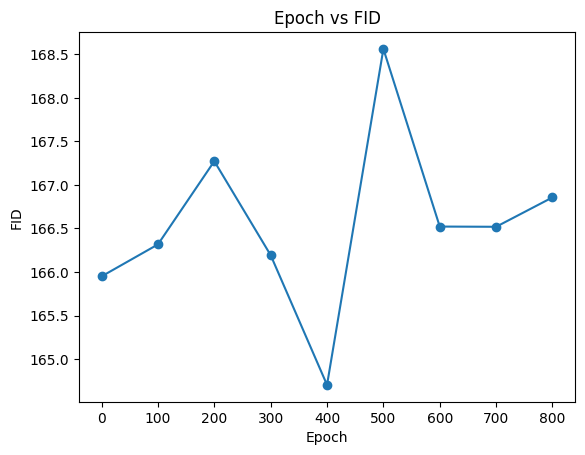

In [6]:
plt.plot(list(fids.keys()),list(fids.values()),'-o')
plt.xlabel('Epoch')
plt.ylabel('FID')
plt.title('Epoch vs FID')
plt.show()

#### Note the scale - there isn't much variation in the FID across the epochs. It varies from 165.0 to 168.5.

In [23]:
print("FID: ", metrics_dict['frechet_inception_distance'])

print(metrics_dict)

print(f"Best FID: {min(fids.values())} occured at epoch {min(fids, key=fids.get)}")
best_epoch = min(fids, key=fids.get)

FID:  166.85644080738984
{'inception_score_mean': 5.622914117219244, 'inception_score_std': 0.4315310552415959, 'frechet_inception_distance': 166.85644080738984, 'kernel_inception_distance_mean': 0.0892242450225226, 'kernel_inception_distance_std': 1.621094732032066e-07}
Best FID: 164.70294374662382 occured at epoch 400


In [17]:
def train_model(model, train_loader, val_loader, num_epochs=10):
    since = time.time()

    criterion = nn.CrossEntropyLoss()
    optimizer = optim.SGD(model.parameters(), lr=0.001, momentum=0.9)
    scheduler = lr_scheduler.StepLR(optimizer, step_size=7, gamma=0.1)

    best_model_wts = model.state_dict()
    best_acc = 0.0

    for epoch in range(num_epochs):
        print(f'Epoch {epoch+1}/{num_epochs}')
        print('-' * 10)

        for phase in ['train', 'val']:
            if phase == 'train':
                model.train()  
                dataloader = train_loader
            else:
                model.eval()   
                dataloader = val_loader

            running_loss = 0.0
            running_corrects = 0

            for inputs, labels in dataloader:
                inputs = inputs.to(device)
                labels = labels.to(device)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)

            if phase == 'train':
                scheduler.step()

            epoch_loss = running_loss / len(dataloader.dataset)
            epoch_acc = running_corrects.double() / len(dataloader.dataset)

            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'val' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = model.state_dict()

        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:.4f}')

    model.load_state_dict(best_model_wts)
    return model

In [18]:
def calculate_metrics(model, dataloader):
    model.eval()
    all_preds = []
    all_labels = []

    with torch.no_grad():
        for inputs, labels in dataloader:
            inputs = inputs.to(device)
            labels = labels.to(device)
            outputs = model(inputs)
            _, preds = torch.max(outputs, 1)
            all_preds.extend(preds.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())

    precision = precision_score(all_labels, all_preds, average='weighted')
    recall = recall_score(all_labels, all_preds, average='weighted')
    f1 = f1_score(all_labels, all_preds, average='weighted')
    cm = confusion_matrix(all_labels, all_preds)
    report = classification_report(all_labels, all_preds)

    print(f'Precision: {precision:.4f}')
    print(f'Recall: {recall:.4f}')
    print(f'F1 Score: {f1:.4f}')
    print('Confusion Matrix:')
    print(cm)
    print('Classification Report:')
    print(report)

In [19]:
data_dir = 'animals_20_classes'

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

dataset = datasets.ImageFolder(data_dir, transform=transform)

train_indices, val_indices = train_test_split(list(range(len(dataset))), test_size=0.2, stratify=dataset.targets, random_state=42)

train_dataset = Subset(dataset, train_indices)
val_dataset = Subset(dataset, val_indices)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)

print(f'Number of training samples: {len(train_dataset)}')
print(f'Number of validation samples: {len(val_dataset)}')

model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 20)

model = model.to(device)

model = train_model(model, train_loader, val_loader, num_epochs=10)

Number of training samples: 960
Number of validation samples: 240


/data3/home/yaswanthk/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/data3/home/yaswanthk/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/10
----------
train Loss: 2.5895 Acc: 0.3094
val Loss: 1.5556 Acc: 0.7792

Epoch 2/10
----------
train Loss: 1.0664 Acc: 0.8958
val Loss: 0.6535 Acc: 0.9292

Epoch 3/10
----------
train Loss: 0.4947 Acc: 0.9625
val Loss: 0.4169 Acc: 0.9667

Epoch 4/10
----------
train Loss: 0.2928 Acc: 0.9812
val Loss: 0.3306 Acc: 0.9625

Epoch 5/10
----------
train Loss: 0.2037 Acc: 0.9948
val Loss: 0.2647 Acc: 0.9625

Epoch 6/10
----------
train Loss: 0.1482 Acc: 0.9979
val Loss: 0.2333 Acc: 0.9625

Epoch 7/10
----------
train Loss: 0.1164 Acc: 0.9979
val Loss: 0.2189 Acc: 0.9667

Epoch 8/10
----------
train Loss: 0.0972 Acc: 1.0000
val Loss: 0.2139 Acc: 0.9667

Epoch 9/10
----------
train Loss: 0.0915 Acc: 1.0000
val Loss: 0.2131 Acc: 0.9667

Epoch 10/10
----------
train Loss: 0.0899 Acc: 1.0000
val Loss: 0.2086 Acc: 0.9667

Training complete in 1m 17s
Best val Acc: 0.9667


In [20]:
calculate_metrics(model, val_loader)

Precision: 0.9680
Recall: 0.9667
F1 Score: 0.9662
Confusion Matrix:
[[12  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0 11  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  1  0  0]
 [ 0  0 12  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0 11  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0 12  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0 12  0  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0 12  0  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 12  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0 12  0  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0  0  0]
 [ 0  1  0  0  0  0  0  0  0  0  0  0 11  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0 12  0  0  0  0  0  0]
 [ 0  0  1  0  0  0  0  0  0  0  0  0  0  1  9  1 

The following metrics were obtained from training a ResNet-based classifier without data augmentation by sampling 20 classes and training a resnet based classifier:

- **Best Validation Accuracy**: 0.9667
- **Precision**: 0.9680
- **Recall**: 0.9667
- **F1 Score**: 0.9662

In [68]:
import os
import numpy as np
import torch
from torchvision import models, transforms
from PIL import Image
from sklearn.manifold import TSNE
import matplotlib.pyplot as plt

def plot_tsne_features_from_resnet(dataset_path='animals_20_classes'):
    specific_classes =['hippopotamus','eagle','turtle']

    class_folders = sorted(os.listdir(dataset_path))

    image_paths = []
    labels = []

    for class_folder in class_folders:
        if class_folder in specific_classes:
            class_path = os.path.join(dataset_path, class_folder)
            image_files = sorted(os.listdir(class_path))
            
            selected_images = np.random.choice(image_files, size=60, replace=False)
            
            for image_file in selected_images:
                image_path = os.path.join(class_path, image_file)
                
                image_paths.append(image_path)
                labels.append(class_folder)

    image_features = []
    class_labels = []

    model = models.resnet18(weights=True)
    model = torch.nn.Sequential(*(list(model.children())[:-1]))
    model.eval()

    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
    ])

    for image_path in image_paths:
        image = Image.open(image_path)
        
        image = transform(image).unsqueeze(0)  
        
        with torch.no_grad():
            features = model(image).squeeze().numpy()  
        
        image_features.append(features)
        class_labels.append(labels[image_paths.index(image_path)])

    image_features = np.array(image_features)
    class_labels = np.array(class_labels)

    tsne = TSNE(n_components=2, perplexity=5, random_state=42)  # Set perplexity to a value less than the number of samples
    tsne_features = tsne.fit_transform(image_features)

    plt.figure(figsize=(12, 10))
    for class_label in specific_classes:
        indices = np.where(class_labels == class_label)
        plt.scatter(tsne_features[indices, 0], tsne_features[indices, 1], label=class_label)
    plt.title('t-SNE Plot of 10 Images from Each Class')
    plt.xlabel('t-SNE Feature 1')
    plt.ylabel('t-SNE Feature 2')
    plt.legend()
    plt.show()

 - Generating 100 more images per each of the randomly sampled 20 classes

In [24]:
torch_fidelity.defaults.DEFAULTS['samples_find_deep'] = True
netG = ConditionalGenerator(num_classes=20, embed_size=embed_size, z=100).to(device)

class_names = ['eagle', 'turtle', 'pigeon', 'sparrow', 'deer', 'elephant', 'hippopotamus', 
               'dragonfly', 'mosquito', 'butterfly', 'snake', 'horse', 'bison', 'parrot', 
               'orangutan', 'possum', 'flamingo', 'sandpiper', 'rat', 'coyote']

base_dir = 'conditional_generated_images'
os.makedirs(base_dir, exist_ok=True)

for class_name in class_names:
    os.makedirs(os.path.join(base_dir, class_name), exist_ok=True)

num_images_per_class = 100
num_classes = 20
batch_size = 100
num_batches = num_images // batch_size
fids = {}

netG.load_state_dict(torch.load(f'conditional_models_20classes/gen_{best_epoch}.pth'))
        
for i in range(num_classes):
    noise =  torch.randn(batch_size, 100, 1, 1, device=device)
    labels = torch.full((batch_size,), i, device=device, dtype=torch.long)
    gen_samples = netG(noise, labels).detach().cpu()
    for id, sample in enumerate(gen_samples):
        sample = sample.view(3, 128, 128)
        sample = (sample / 2.0 + 0.5).clip(0, 1)
        class_name = class_names[i]
        save_image(sample, os.path.join(base_dir, class_name, f'sample_{id}.jpg'))
        

#### Combining the images generated by the Conditional Generator with the original images

In [25]:
source_dirs = ['animals_20_classes', 'conditional_generated_images']
merged_dir = 'merged_animals_20_classes'

os.makedirs(merged_dir, exist_ok=True)

class_names = ['eagle', 'turtle', 'pigeon', 'sparrow', 'deer', 'elephant', 'hippopotamus', 
               'dragonfly', 'mosquito', 'butterfly', 'snake', 'horse', 'bison', 'parrot', 
               'orangutan', 'possum', 'flamingo', 'sandpiper', 'rat', 'coyote']

for class_name in class_names:
    os.makedirs(os.path.join(merged_dir, class_name), exist_ok=True)

for source_dir in source_dirs:
    for class_name in class_names:
        class_dir = os.path.join(source_dir, class_name)
        if os.path.exists(class_dir):
            for file_name in os.listdir(class_dir):
                source_file = os.path.join(class_dir, file_name)
                destination_file = os.path.join(merged_dir, class_name, file_name)
                shutil.copy(source_file, destination_file)

print(f'Successfully merged data into {merged_dir}')

Successfully merged data into merged_animals_20_classes


#### Retrain the ResNet classifier using the above augmented data

In [23]:
data_dir = 'merged_animals_20_classes'

transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

dataset = datasets.ImageFolder(data_dir, transform=transform)

train_indices, val_indices = train_test_split(list(range(len(dataset))), test_size=0.2, stratify=dataset.targets, random_state=42)

train_dataset = Subset(dataset, train_indices)
val_dataset = Subset(dataset, val_indices)

train_loader = DataLoader(train_dataset, batch_size=32, shuffle=True, num_workers=4)
val_loader = DataLoader(val_dataset, batch_size=32, shuffle=False, num_workers=4)

print(f'Number of training samples: {len(train_dataset)}')
print(f'Number of validation samples: {len(val_dataset)}')


model = models.resnet18(pretrained=True)
num_ftrs = model.fc.in_features
model.fc = nn.Linear(num_ftrs, 20)

model = model.to(device)

model = train_model(model, train_loader, val_loader, num_epochs=10)

Number of training samples: 2560
Number of validation samples: 640


/data3/home/yaswanthk/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/data3/home/yaswanthk/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Epoch 1/10
----------
train Loss: 2.5206 Acc: 0.3164
val Loss: 1.7084 Acc: 0.6469

Epoch 2/10
----------
train Loss: 1.1701 Acc: 0.8223
val Loss: 0.8230 Acc: 0.8500

Epoch 3/10
----------
train Loss: 0.4931 Acc: 0.9508
val Loss: 0.4872 Acc: 0.9125

Epoch 4/10
----------
train Loss: 0.2386 Acc: 0.9855
val Loss: 0.3533 Acc: 0.9313

Epoch 5/10
----------
train Loss: 0.1400 Acc: 0.9934
val Loss: 0.2859 Acc: 0.9406

Epoch 6/10
----------
train Loss: 0.0916 Acc: 0.9977
val Loss: 0.2549 Acc: 0.9453

Epoch 7/10
----------
train Loss: 0.0631 Acc: 0.9988
val Loss: 0.2283 Acc: 0.9516

Epoch 8/10
----------
train Loss: 0.0487 Acc: 0.9996
val Loss: 0.2281 Acc: 0.9516

Epoch 9/10
----------
train Loss: 0.0474 Acc: 1.0000
val Loss: 0.2276 Acc: 0.9500

Epoch 10/10
----------
train Loss: 0.0445 Acc: 0.9996
val Loss: 0.2236 Acc: 0.9500

Training complete in 1m 39s
Best val Acc: 0.9516


In [24]:
calculate_metrics(model, val_loader)

Precision: 0.9517
Recall: 0.9500
F1 Score: 0.9502
Confusion Matrix:
[[29  0  0  0  0  0  0  0  1  0  0  0  0  0  0  0  0  0  0  2]
 [ 0 30  0  0  0  0  0  0  0  0  0  1  0  0  0  0  0  1  0  0]
 [ 0  0 28  1  0  0  0  0  0  0  0  0  0  0  0  2  0  0  0  1]
 [ 0  0  0 31  0  0  0  0  0  0  0  1  0  0  0  0  0  0  0  0]
 [ 0  1  0  0 30  0  0  0  0  0  0  0  0  0  0  0  0  1  0  0]
 [ 0  0  0  0  0 31  0  0  0  0  0  0  0  1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0 31  0  0  1  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0 32  0  0  0  0  0  0  0  0  0  0  0  0]
 [ 1  0  0  0  0  0  0  0 29  1  0  0  0  0  0  0  0  0  0  1]
 [ 0  0  0  0  1  0  0  0  0 31  0  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0 32  0  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0 32  0  0  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  1 30  1  0  0  0  0  0  0]
 [ 0  0  0  0  0  0  0  0  0  0  0  0  0 32  0  0  0  0  0  0]
 [ 0  0  2  0  0  0  0  0  0  0  0  0  0  1 29  0 

### ResNet-Based Classifier Performance Metrics (Augmented Dataset)

After training the ResNet-based classifier with an augmented dataset consisting of 100 additional images per class generated using a conditional GAN, the following metrics were obtained:

- **Best Validation Accuracy**: 0.9516
- **Precision**: 0.9517
- **Recall**: 0.9500
- **F1 Score**: 0.9502

Despite the introduction of additional training images, the performance slightly dropped compared to previous results, possibly due to the quality and diversity of the generated images affecting the model's generalization capabilities. This also indicates that the generated data quality is low.


### Comparision of t-SNE Visualization of Class Features Generated by Conditional GAN and actual dataset


#### t-SNE visualization on given dataset

/data3/home/yaswanthk/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


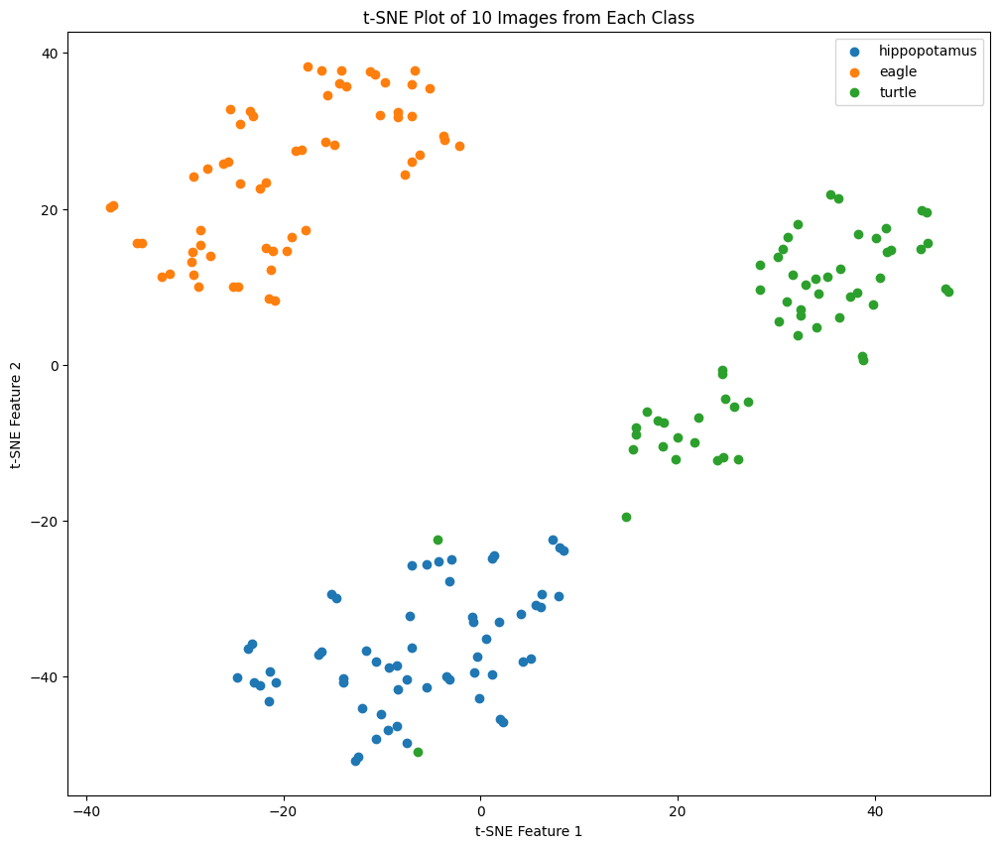

In [78]:
plot_tsne_features_from_resnet("animals_20_classes")

### t-SNE visualization on generated images

/data3/home/yaswanthk/.local/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


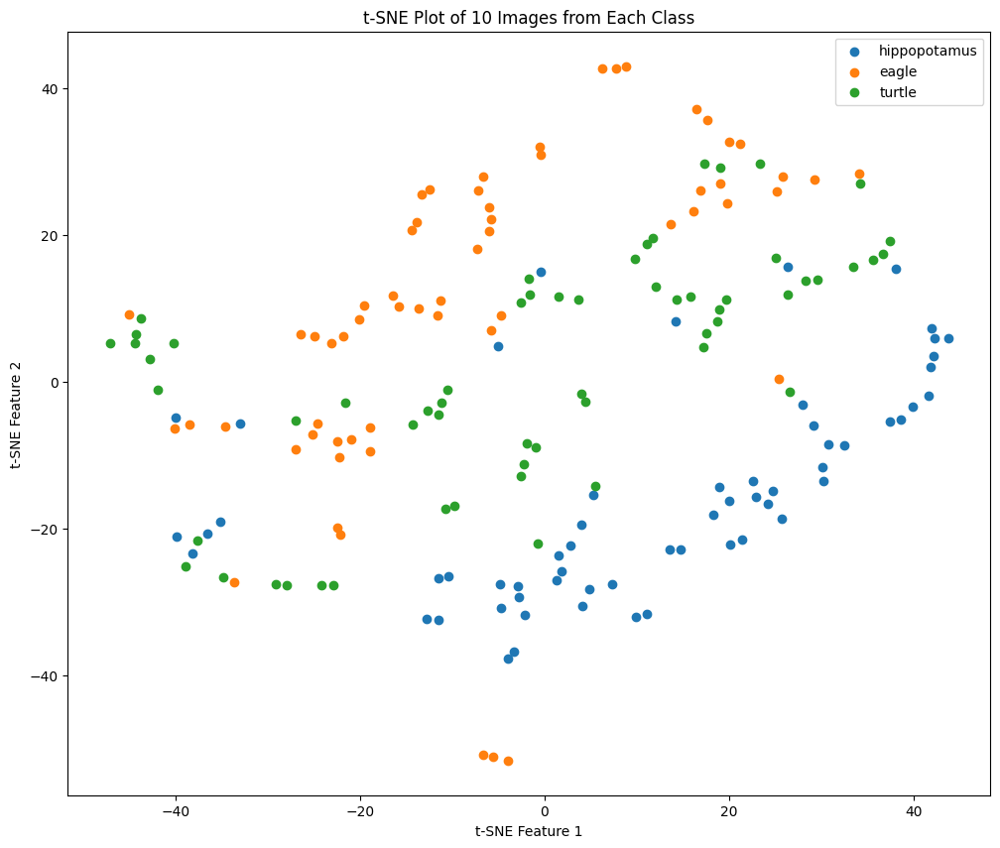

In [81]:
plot_tsne_features_from_resnet("conditional_generated_images")

### Observations from t-SNE Visualization

The t-SNE visualization of the generated images indicates that the clustering is not as distinct as expected. This suggests that the generated images have not effectively learned the features of each class present in the actual dataset, leading to a lack of diversity and generalization in the generated samples.


## Necessity of DiffAugment

We optimized the following three objectives with and without DiffAugment:
1. Standard GAN objective
2. WGAN objective
3. Conditional GAN objective

The FID Scores with and without DiffAugment are shown below:

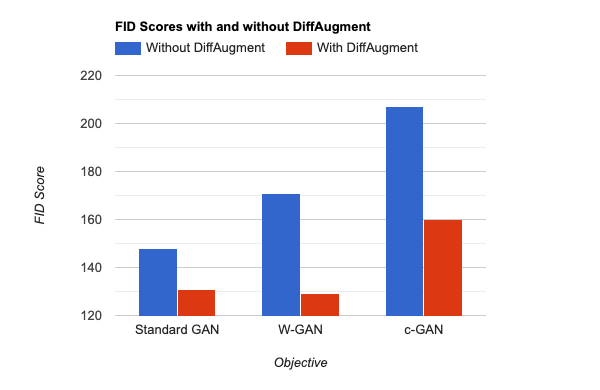

On average, FID reduces by 35.33 points after using DiffAugment, highlighting it's strength. An important observation to make here is that without DiffAugment, W-GAN performs worse than the standard GAN. But this is to be expected since in the original DiffAugment paper, the authors propose DiffAugment on W-GAN and not on the standard GAN 